In [1]:
import cv2
import json
import numpy as np
from matplotlib import pyplot as plt
import pandas

In [128]:
class ImageTransformer(object):

    def __init__(self, image):
        self.image = image

        self.height = self.image.shape[0]
        self.width = self.image.shape[1]
        self.num_channels = self.image.shape[2]

    """ Wrapper of Rotating a Image """

    def rotate_along_axis(self, theta=0, phi=0, gamma=0, dx=0, dy=0, dz=0):
        # Get ideal focal length on z axis
        # NOTE: Change this section to other axis if needed
        d = np.sqrt(self.height ** 2 + self.width ** 2)
        self.focal = d / (2 * np.sin(gamma) if np.sin(gamma) != 0 else 1)
        dz = self.focal

        # Get projection matrix
        mat = self.get_M(theta, phi, gamma, dx, dy, dz)

        return cv2.warpPerspective(self.image.copy(), mat, (self.width, self.height))

    """ Get Perspective Projection Matrix """

    def get_M(self, theta, phi, gamma, dx, dy, dz):
        w = self.width
        h = self.height
        f = self.focal

        # Projection 2D -> 3D matrix
        A1 = np.array([[1, 0, -w / 2],
                       [0, 1, -h / 2],
                       [0, 0, 1],
                       [0, 0, 1]])

        # Rotation matrices around the X, Y, and Z axis
        RX = np.array([[1, 0, 0, 0],
                       [0, np.cos(theta), -np.sin(theta), 0],
                       [0, np.sin(theta), np.cos(theta), 0],
                       [0, 0, 0, 1]])

        RY = np.array([[np.cos(phi), 0, -np.sin(phi), 0],
                       [0, 1, 0, 0],
                       [np.sin(phi), 0, np.cos(phi), 0],
                       [0, 0, 0, 1]])

        RZ = np.array([[np.cos(gamma), -np.sin(gamma), 0, 0],
                       [np.sin(gamma), np.cos(gamma), 0, 0],
                       [0, 0, 1, 0],
                       [0, 0, 0, 1]])

        # Composed rotation matrix with (RX, RY, RZ)
        R = np.dot(np.dot(RX, RY), RZ)

        # Translation matrix
        T = np.array([[1, 0, 0, dx],
                      [0, 1, 0, dy],
                      [0, 0, 1, dz],
                      [0, 0, 0, 1]])

        # Projection 3D -> 2D matrix
        A2 = np.array([[f, 0, w / 2, 0],
                       [0, f, h / 2, 0],
                       [0, 0, 1, 0]])

        # Final transformation matrix
        return np.dot(A2, np.dot(T, np.dot(R, A1)))

    
def sn(s):
    return s['secs'] + s['nsecs'] / 1000000000

    
def stats(dat):
    initial_t = sn(dat['image_initial'])
    final_t = sn(dat['image_final'])
        
    delta_t = final_t - initial_t
    
    imu_stamps = np.zeros((len(dat['imu']),))
    imu_av = np.zeros((len(dat['imu']),))
    
    for idx, imu in enumerate(dat['imu']):
        
        imu_av[idx] = imu['angular_velocity']['z'] 
        imu_stamps[idx] = sn(imu['stamp'])
                                                 
    
    avg_imu_t = np.average(imu_stamps)
    

    
    max_imu_t = np.amax(imu_stamps)
    min_imu_t = np.amin(imu_stamps)
    med_imu_t = np.median(imu_stamps)
    
    avg_imu_z = np.average(imu_av)
    max_imu_z = np.amax(imu_av)
    min_imu_z = np.amin(imu_av)
    mid_imu_z = np.median(imu_av)    
    
    return {'initial_t': initial_t,
           'final_t': final_t,
           'delta_t': delta_t,
           'avg_imu_t': avg_imu_t,
           'max_imu_t': max_imu_t,
           'min_imu_t': min_imu_t,
           'med_imu_t': med_imu_t,
           'avg_imu_z': avg_imu_z,
           'max_imu_z': max_imu_z,
           'min_imu_z': min_imu_z,
           'mid_imu_z': mid_imu_z}
        
    

In [129]:
# Radians
num = 2*np.pi * (1/200) 
# Seconds
den = 0.005

print ("Radian/s: %f" % (num/den * 0.0337))
print ("Degree/s: %f" % (num/den * 0.0337 * 180/np.pi))

Radian/s: 0.211743
Degree/s: 12.132000


In [282]:
skip_count = 0
process_count = 0

def explore(dat, stats, z_rad_s, dx_coeff=2.646771, debug=True, threshold=128):
    motion = False
    global skip_count, process_count
    
    phi_coeff = 8
    phi_coeff = 2000 / 32768
    
    # Find optimal phi based on timestamps and imu readings
    phi_average = stats['delta_t'] * z_rad_s * phi_coeff
    
    if phi_average < 0.01:
        skip_count += 1
        return 0.
    else:
        process_count += 1
        
    dx = phi_average * 180. / np.pi * dx_coeff

    
    if debug:
        print("--IMAGE--")
        print("IMU Z (RAD/S): %f" % (z_rad_s / phi_coeff))
        print("DELTA_T (S): %f" % stats['delta_t'])
        print("PHI (RAD): %f" % (phi_average))
        print("DX (PIX): %f" % dx)
            
    initial = cv2.imread('data/' + dat['image_initial']['filename'])
    final = cv2.imread('data/' + dat['image_final']['filename'])
    
    initial = cv2.cvtColor(initial, cv2.COLOR_BGR2GRAY)
    final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
    
    if True:
        initial = cv2.equalizeHist(initial.copy())
        final = cv2.equalizeHist(final.copy())
        
    if True:
        initial = cv2.GaussianBlur(initial, (5, 5), 0)
        final = cv2.GaussianBlur(final, (5, 5), 0)

    frame_initial_warped = np.reshape(initial.copy(), (initial.shape[0], initial.shape[1], 1))
    it = ImageTransformer(frame_initial_warped)
    frame_initial_warped = it.rotate_along_axis(phi=phi_average, dx=dx)
    
    
    frame_delta_unwarped = cv2.absdiff(initial, final)
    frame_delta_warped = cv2.absdiff(frame_initial_warped, final)

    frame_x = int(dx)
    frame_y = int(dx/2)

    frame_delta_warped[0:frame_y, 0:frame_delta_warped.shape[1]] = 0
    frame_delta_warped[frame_delta_warped.shape[0] - frame_y:frame_delta_warped.shape[0], 0:frame_delta_warped.shape[1]] = 0

    frame_delta_warped[0:frame_delta_warped.shape[0], 0:frame_x] = 0
    frame_delta_warped[0:frame_delta_warped.shape[0], frame_delta_warped.shape[1] - frame_x:frame_delta_warped.shape[1]] = 0

    frame_delta_unwarped[0:frame_y, 0:frame_delta_unwarped.shape[1]] = 0
    frame_delta_unwarped[frame_delta_unwarped.shape[0] - frame_y:frame_delta_unwarped.shape[0], 0:frame_delta_unwarped.shape[1]] = 0

    frame_delta_unwarped[0:frame_delta_unwarped.shape[0], 0:frame_x] = 0
    frame_delta_unwarped[0:frame_delta_unwarped.shape[0], frame_delta_unwarped.shape[1] - frame_x:frame_delta_unwarped.shape[1]] = 0
        
    pos_score = (int(np.sum(frame_delta_warped)) - int(np.sum(frame_delta_unwarped)))
    
    if pos_score >= 0:
        thresh = cv2.threshold(frame_delta_unwarped, threshold, 255, cv2.THRESH_BINARY)[1]
    else:
        thresh = cv2.threshold(frame_delta_warped, threshold, 255, cv2.THRESH_BINARY)[1]

    # dilate the thresholded image to fill in holes, then find contours
    # on thresholded image
    thresh = cv2.dilate(thresh, None, iterations=3)

    im2, cnts, _ = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)  
    rectangles = []
    
    for c in cnts:
        area = cv2.contourArea(c)
        if area < int(0.025 * im2.shape[0] * im2.shape[1]) or area > int(1.0 * im2.shape[0] * im2.shape[1]):
            continue        
        x,y,w,h = cv2.boundingRect(c)
        
        motion = True
        cv2.rectangle(im2, (x, y),
                  (x + w, y + h), 255, 2)
    
    if debug:
        print("SCORE: %d" % pos_score)
        
        plt.title("Initial")
        plt.imshow(initial, vmin=0, vmax=255)
        plt.show()

        plt.title("Final")
        plt.imshow(final, vmin=0, vmax=255)
        plt.show()

        plt.title("Warped")
        plt.imshow(frame_initial_warped, vmin=0, vmax=255)
        plt.show()

        plt.title("Delta Unwarped")
        plt.imshow(frame_delta_unwarped, vmin=0, vmax=255)
        plt.show()

        plt.title("Delta Warped")
        plt.imshow(frame_delta_warped, vmin=0, vmax=255)
        plt.show()
        
        plt.title("Thresh")
        plt.imshow(im2)
        plt.show()

        
    return pos_score



In [243]:

skip_count = 0
process_count = 0

files = open('data/list.txt', 'r').read().split("\n")

best_dx = []

sigma = 0.
for file in files:
    try:
        dat = json.loads(open('data/' + file, 'r').read())
    except IsADirectoryError:
        continue
                
    t1 = dat['image_initial']
    t2 = dat['image_final']
    
    dat['image_final'] = t1
    dat['image_initial'] = t2
        
    s = stats(dat)
    
    dx_tries = np.arange(0, 10, 0.01)
    #dx_tries = [2.661458]
        
    scores = np.zeros((len(dx_tries),2))
    for d_x_index, d_x in enumerate(dx_tries):
        score = explore(dat, s, s['min_imu_z'], d_x, debug=False)
        scores[d_x_index][0] = d_x
        scores[d_x_index][1] = score
        if score == 0:
            break
            
        sigma += score
        
    if np.sum(scores[:,1]) != 0:        
        best_dx.append(dx_tries[np.argmin(scores[:,1])])
    
from collections import Counter
bdx_array = np.array(best_dx)

c = Counter(bdx_array)
#print(c)
most_common,num_most_common = c.most_common(1)[0]
#best_option = dx_tries[np.argmax(np.bincount(bdx_array))]
print("Best DX: %f" % most_common)


print("Best DX: %f: " % np.average(bdx_array))
print("STD DX: %f: " % np.std(bdx_array))
print("Score: %d" % (sigma))
print("Processed: %f" % (process_count / (process_count + skip_count) ))


Best DX: 0.000000
Best DX: 2.646771: 
STD DX: 1.554524: 
Score: 260472346
Processed: 0.997857


--IMAGE--
IMU Z (RAD/S): 140.030489
DELTA_T (S): 0.033953
PHI (RAD): 0.017712
DX (PIX): 2.685977
SCORE: 110831


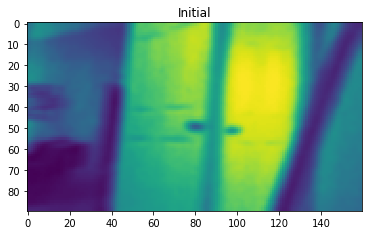

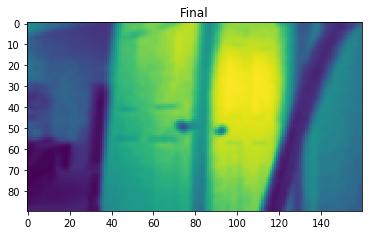

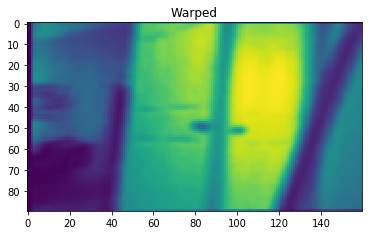

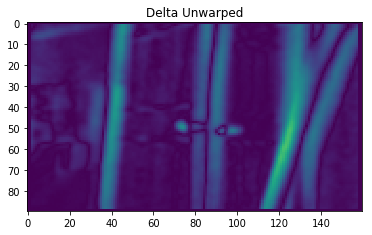

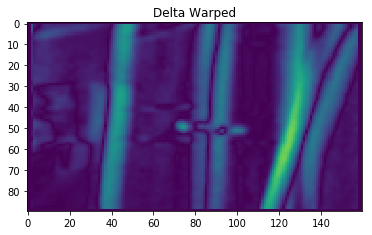

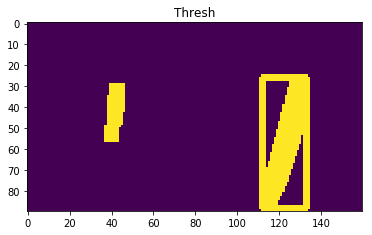

--IMAGE--
IMU Z (RAD/S): 529.214896
DELTA_T (S): 0.033797
PHI (RAD): 0.066630
DX (PIX): 10.104309
SCORE: -78642


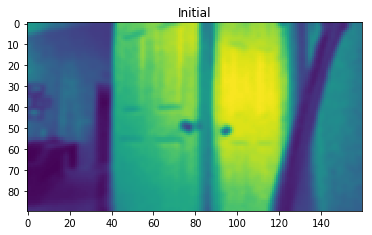

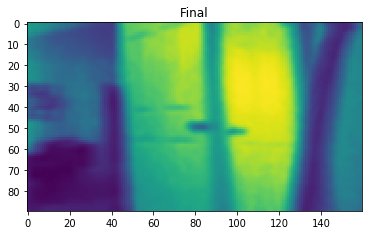

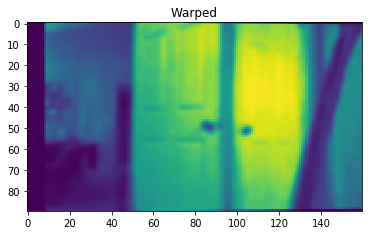

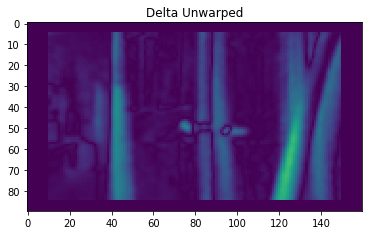

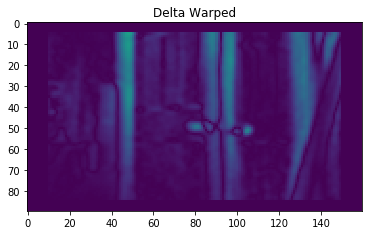

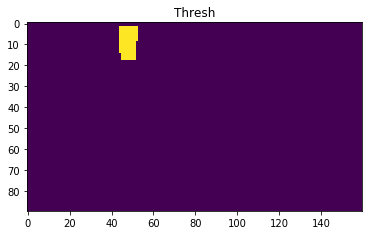

--IMAGE--
IMU Z (RAD/S): 328.188711
DELTA_T (S): 0.033719
PHI (RAD): 0.041225
DX (PIX): 6.251746
SCORE: -267020


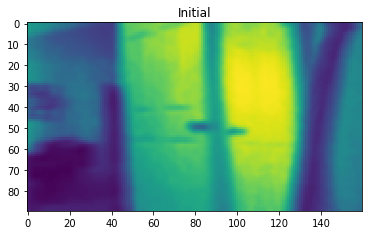

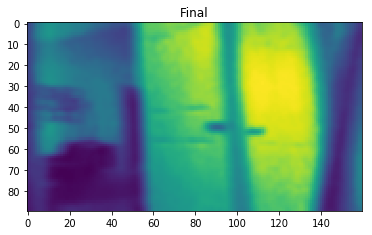

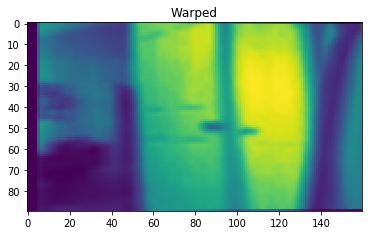

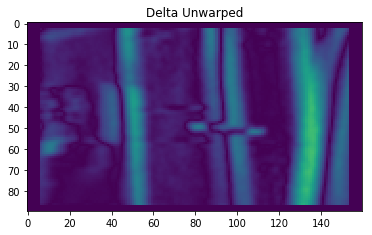

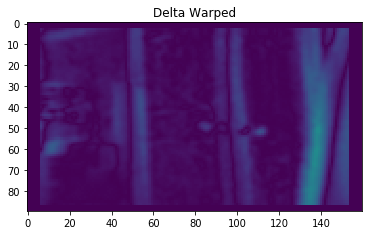

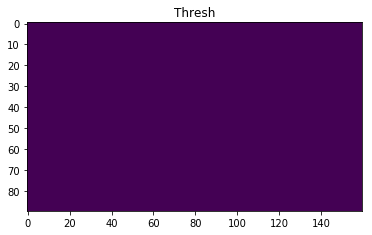

--IMAGE--
IMU Z (RAD/S): 276.144947
DELTA_T (S): 0.034127
PHI (RAD): 0.035108
DX (PIX): 5.324028
SCORE: -242164


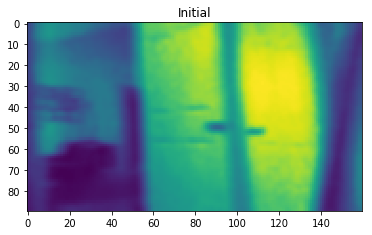

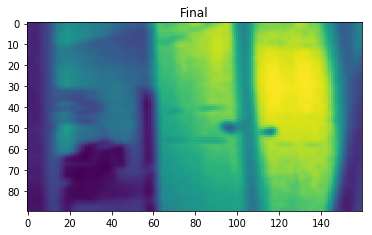

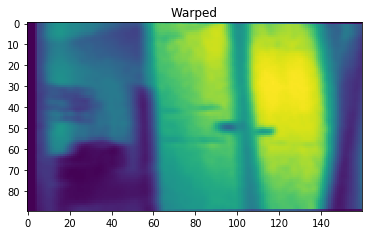

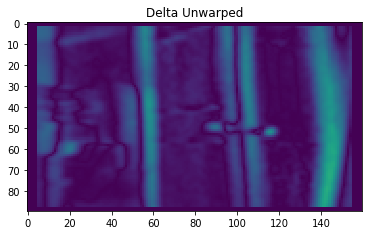

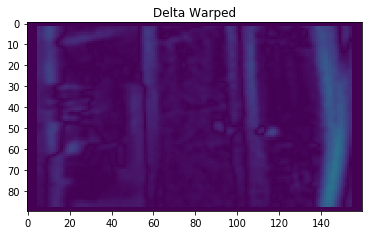

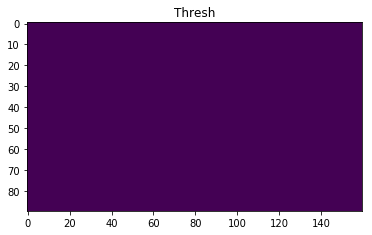

--IMAGE--
IMU Z (RAD/S): 383.663931
DELTA_T (S): 0.033893
PHI (RAD): 0.048441
DX (PIX): 7.346075
SCORE: -198961


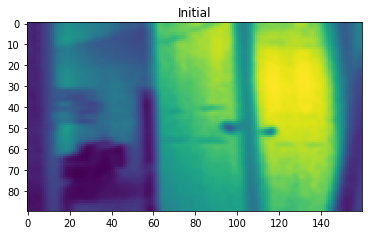

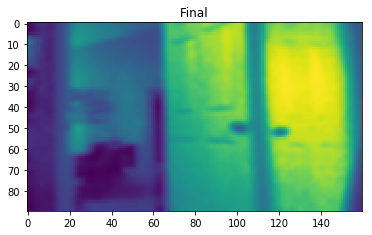

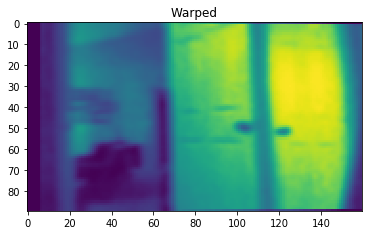

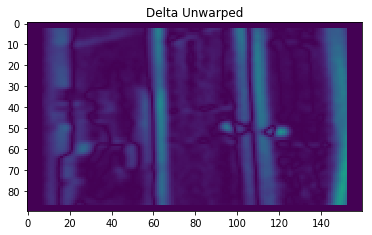

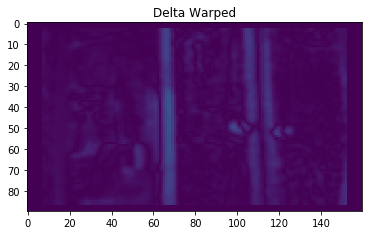

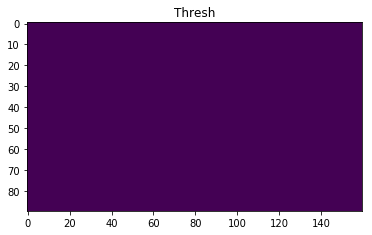

--IMAGE--
IMU Z (RAD/S): 377.658881
DELTA_T (S): 0.031958
PHI (RAD): 0.044962
DX (PIX): 6.818409
SCORE: -206588


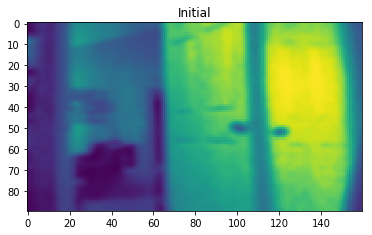

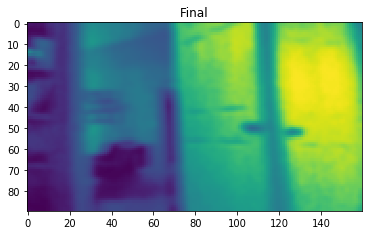

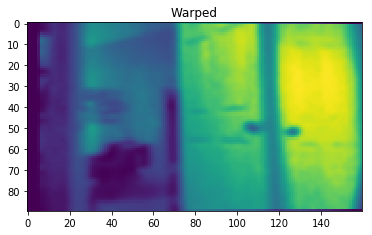

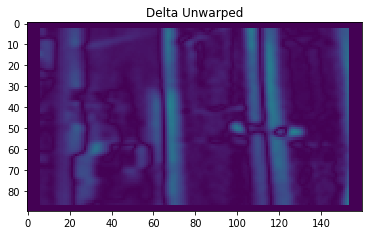

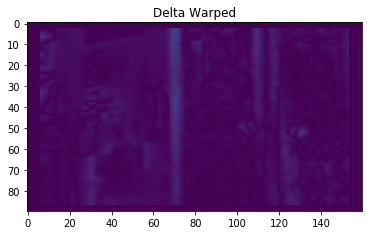

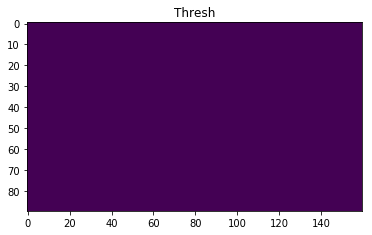

--IMAGE--
IMU Z (RAD/S): 341.914538
DELTA_T (S): 0.032500
PHI (RAD): 0.041397
DX (PIX): 6.277744
SCORE: -158335


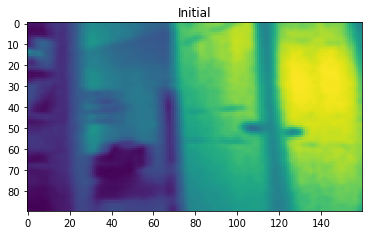

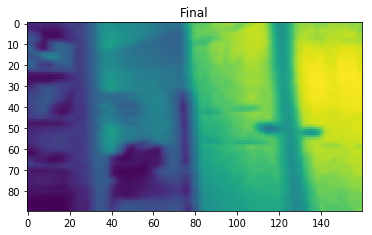

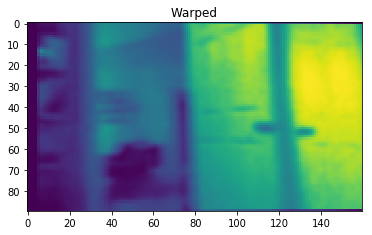

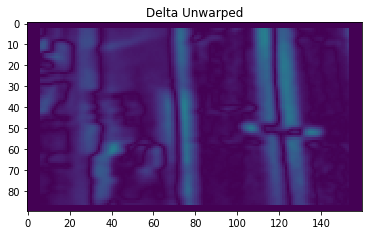

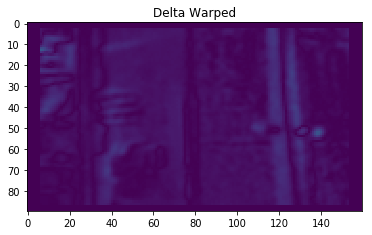

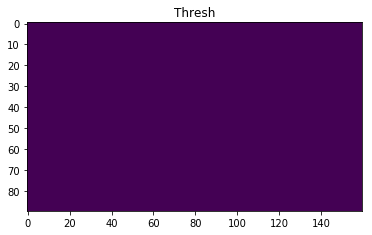

--IMAGE--
IMU Z (RAD/S): 395.388076
DELTA_T (S): 0.098858
PHI (RAD): 0.145612
DX (PIX): 22.081828
SCORE: 9850


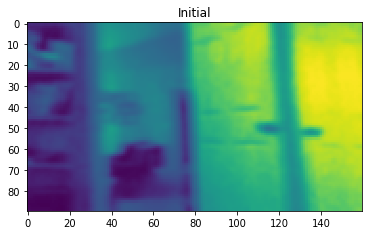

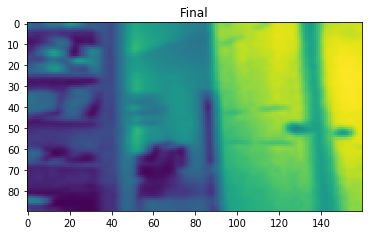

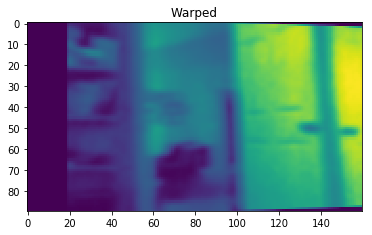

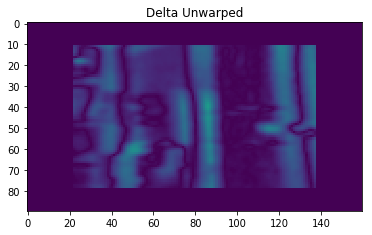

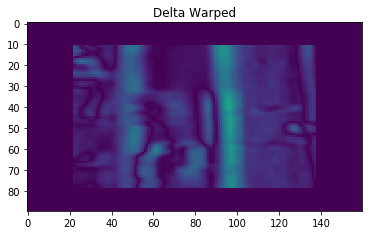

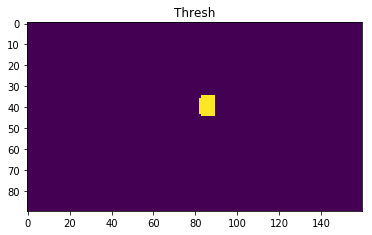

--IMAGE--
IMU Z (RAD/S): 394.244257
DELTA_T (S): 0.081037
PHI (RAD): 0.119017
DX (PIX): 18.048790
SCORE: -171776


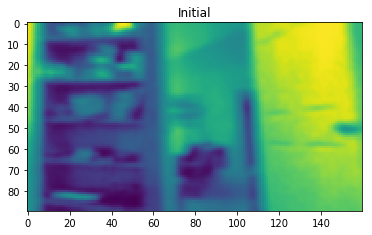

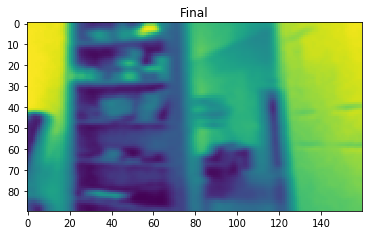

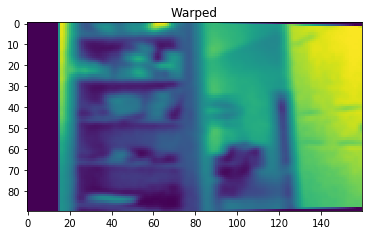

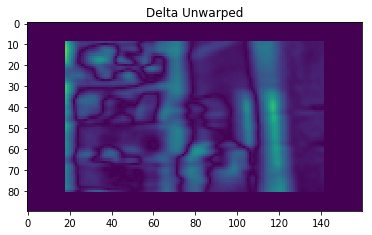

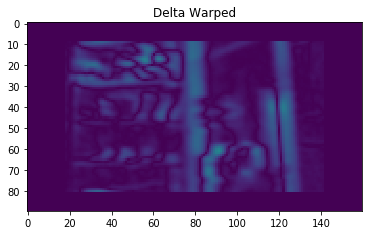

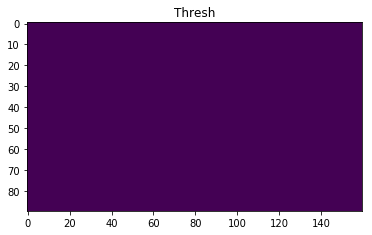

--IMAGE--
IMU Z (RAD/S): 356.498230
DELTA_T (S): 0.019027
PHI (RAD): 0.025269
DX (PIX): 3.831963
SCORE: -175848


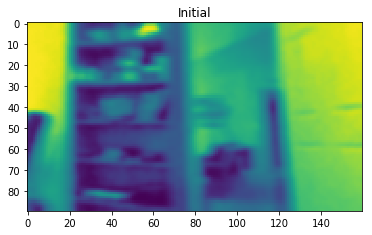

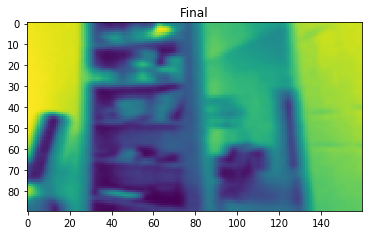

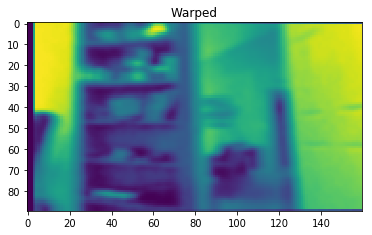

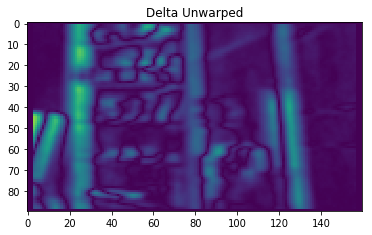

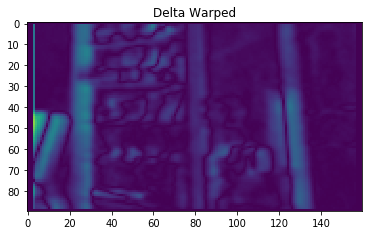

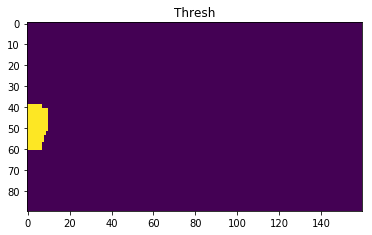

--IMAGE--
IMU Z (RAD/S): 371.653832
DELTA_T (S): 0.033749
PHI (RAD): 0.046726
DX (PIX): 7.085931
SCORE: -331572


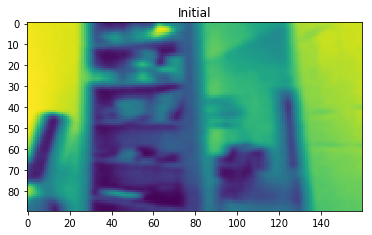

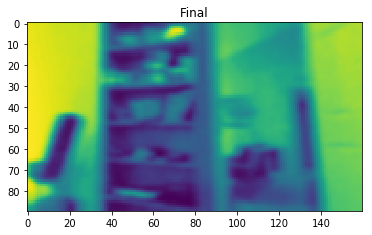

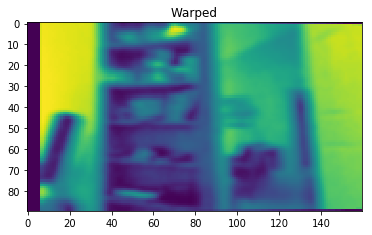

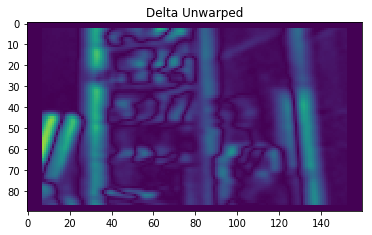

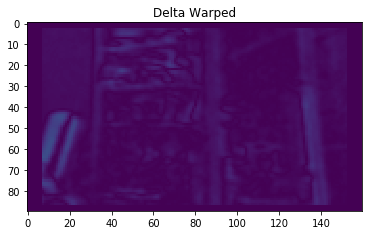

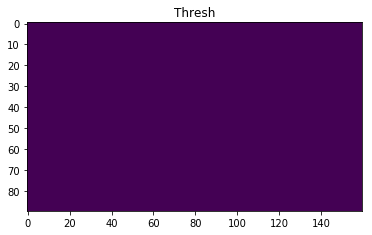

--IMAGE--
IMU Z (RAD/S): 378.516746
DELTA_T (S): 0.032025
PHI (RAD): 0.045158
DX (PIX): 6.848224
SCORE: -172640


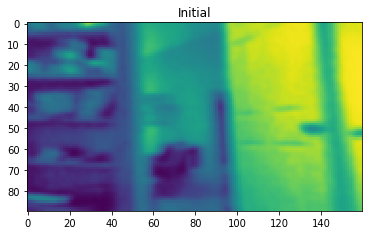

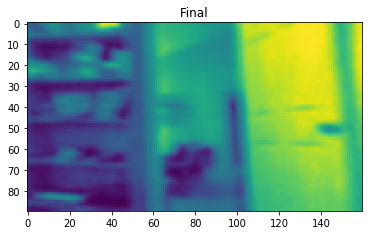

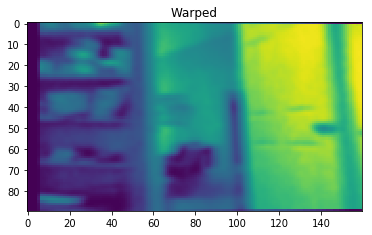

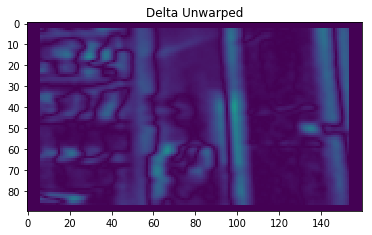

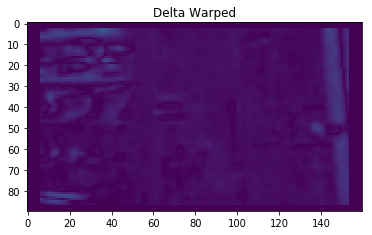

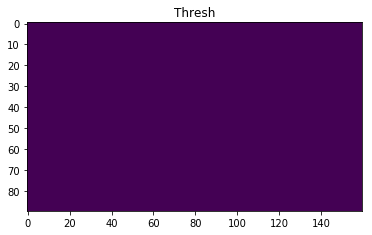

--IMAGE--
IMU Z (RAD/S): 393.386392
DELTA_T (S): 0.032498
PHI (RAD): 0.047625
DX (PIX): 7.222267
SCORE: -343246


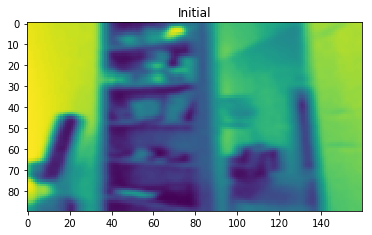

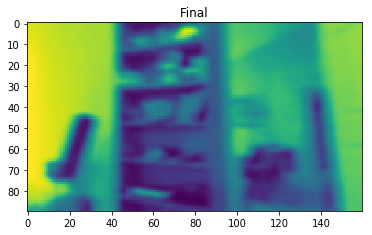

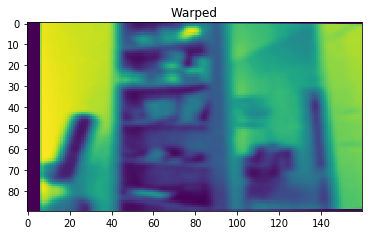

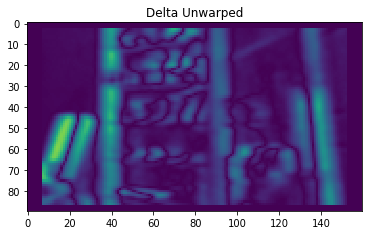

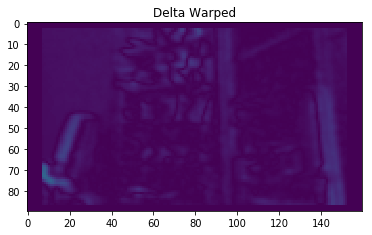

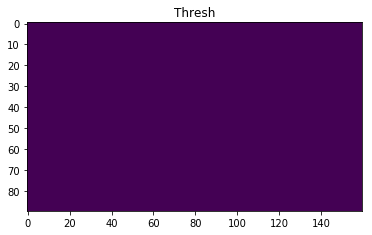

--IMAGE--
IMU Z (RAD/S): 371.939786
DELTA_T (S): 0.088919
PHI (RAD): 0.123205
DX (PIX): 18.683882
SCORE: -207313


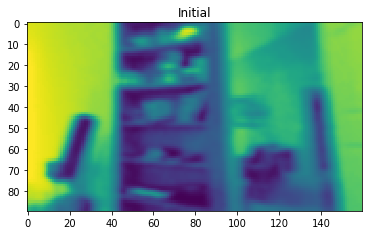

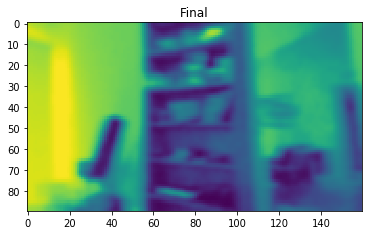

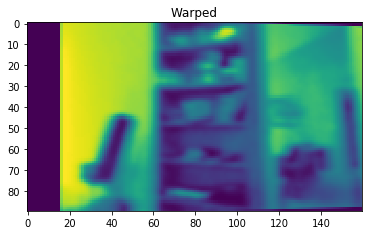

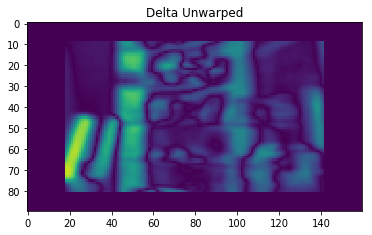

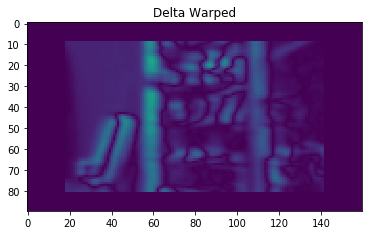

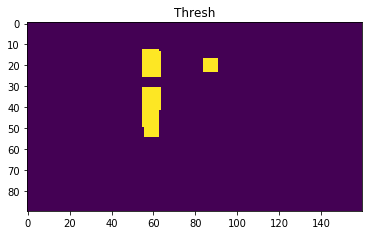

--IMAGE--
IMU Z (RAD/S): 357.356095
DELTA_T (S): 0.033714
PHI (RAD): 0.044881
DX (PIX): 6.806207
SCORE: -223739


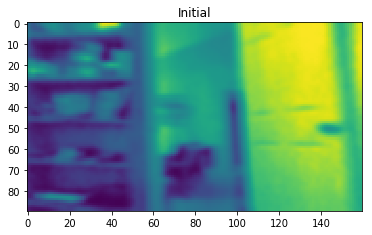

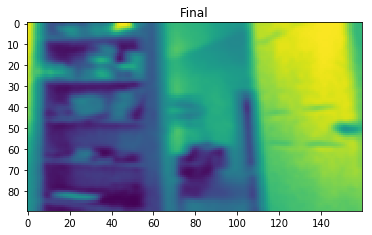

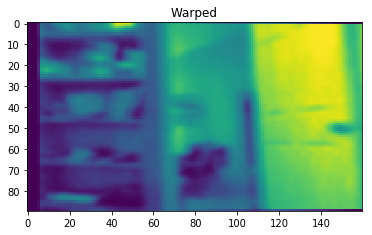

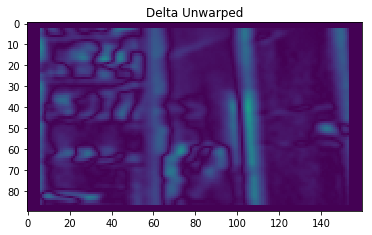

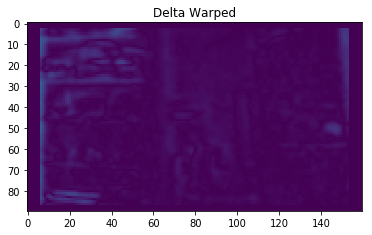

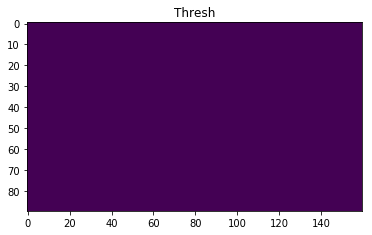

--IMAGE--
IMU Z (RAD/S): 101.998508
DELTA_T (S): 0.033638
PHI (RAD): 0.012781
DX (PIX): 1.938282
SCORE: 88533


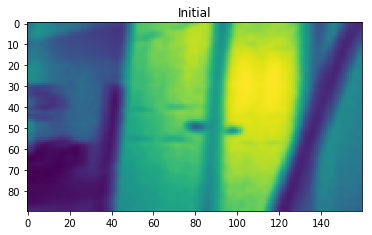

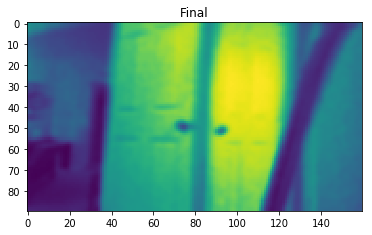

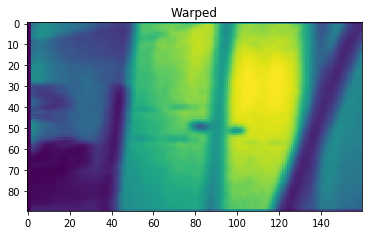

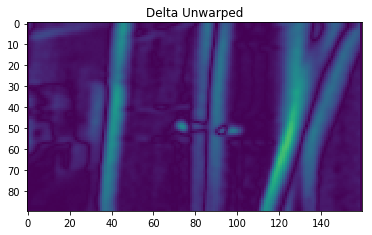

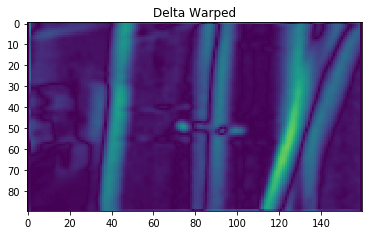

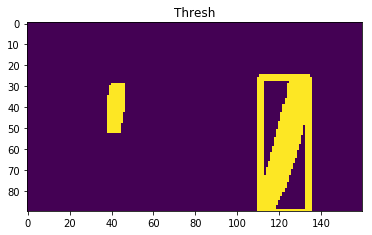

--IMAGE--
IMU Z (RAD/S): 263.276984
DELTA_T (S): 0.032491
PHI (RAD): 0.031867
DX (PIX): 4.832602
SCORE: 226695


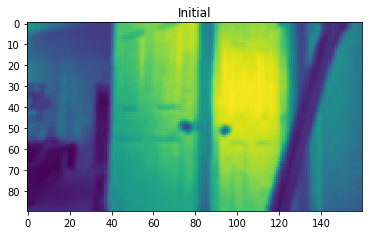

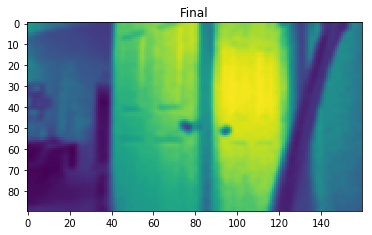

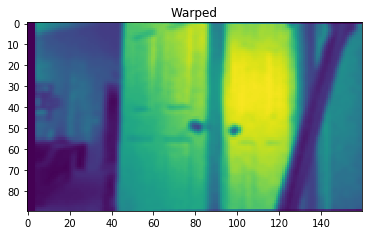

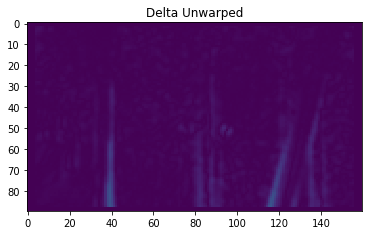

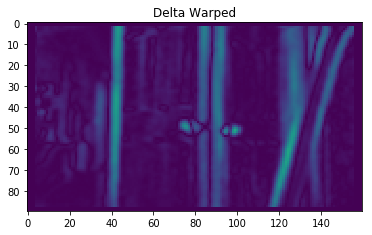

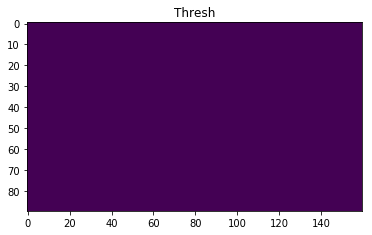

--IMAGE--
IMU Z (RAD/S): 503.764924
DELTA_T (S): 0.034640
PHI (RAD): 0.065007
DX (PIX): 9.858251
SCORE: -70772


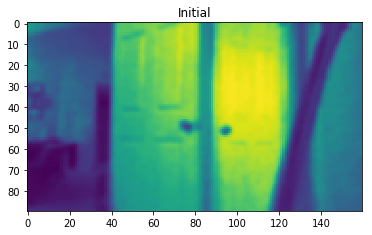

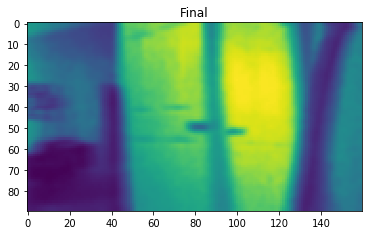

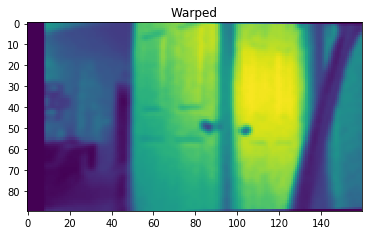

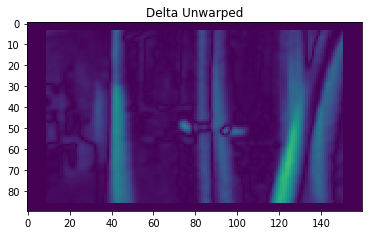

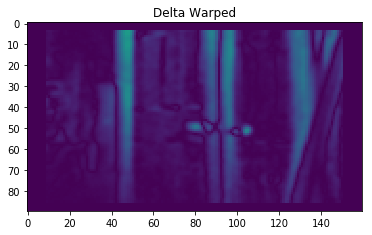

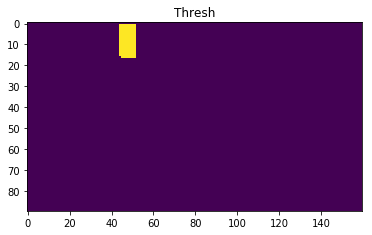

--IMAGE--
IMU Z (RAD/S): 273.857309
DELTA_T (S): 0.088383
PHI (RAD): 0.090168
DX (PIX): 13.673850
SCORE: -411099


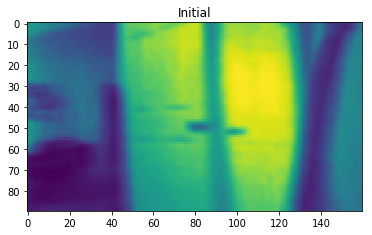

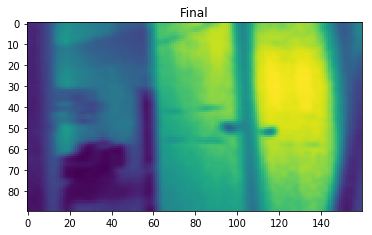

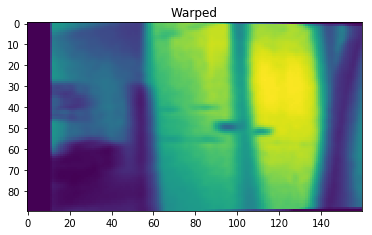

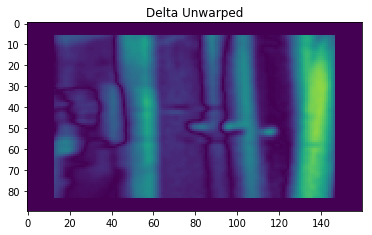

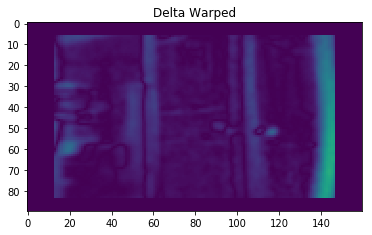

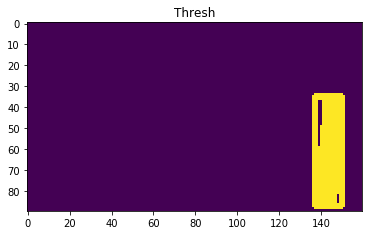

--IMAGE--
IMU Z (RAD/S): 406.540311
DELTA_T (S): 0.011921
PHI (RAD): 0.018054
DX (PIX): 2.737870
SCORE: -134753


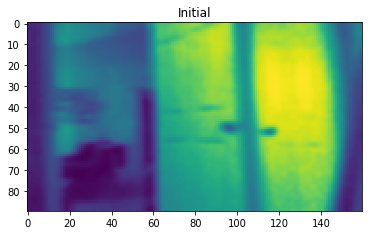

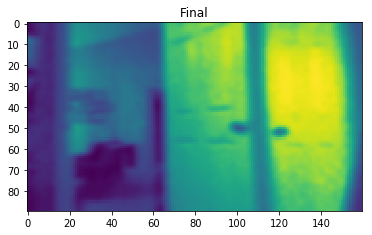

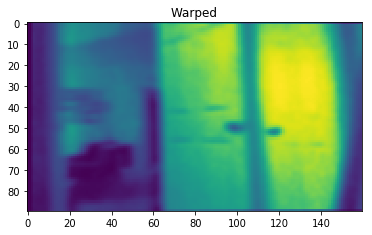

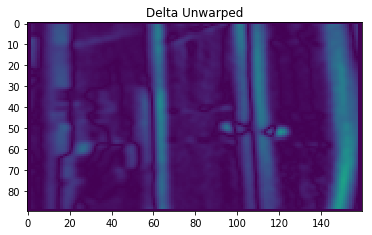

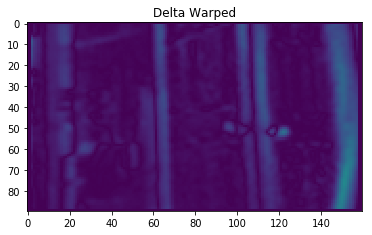

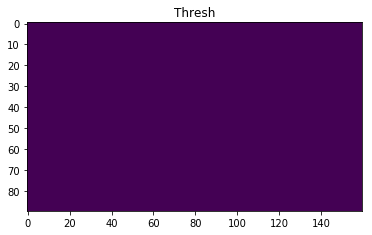

--IMAGE--
IMU Z (RAD/S): 411.401541
DELTA_T (S): 0.032614
PHI (RAD): 0.049983
DX (PIX): 7.579886
SCORE: -179464


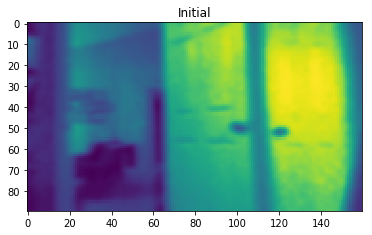

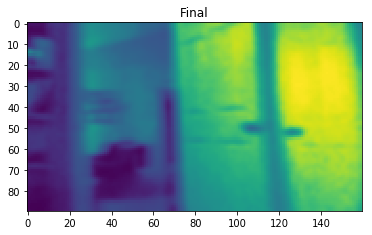

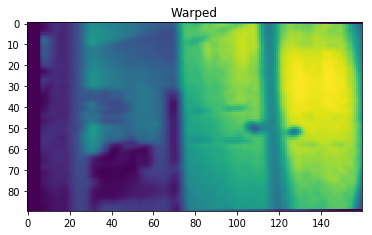

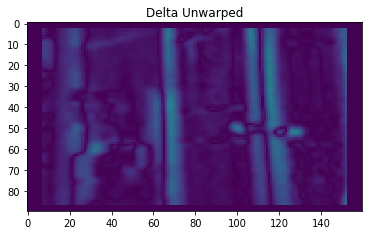

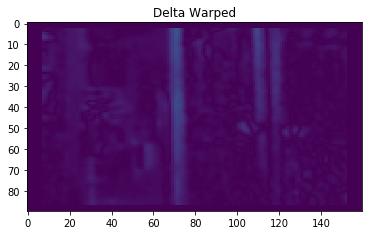

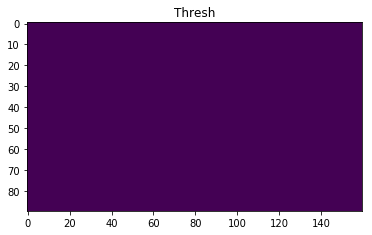

--IMAGE--
IMU Z (RAD/S): 343.344312
DELTA_T (S): 0.032446
PHI (RAD): 0.041500
DX (PIX): 6.293405
SCORE: -157306


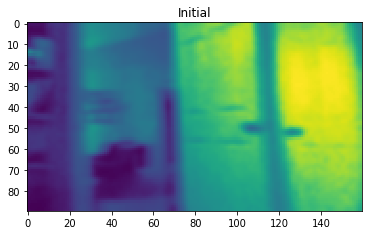

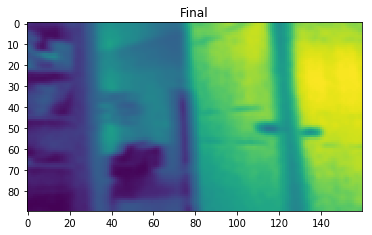

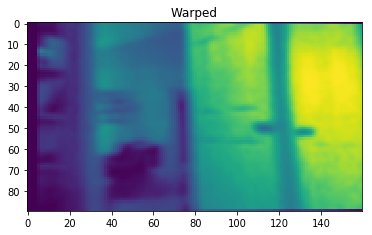

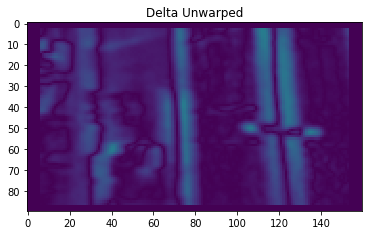

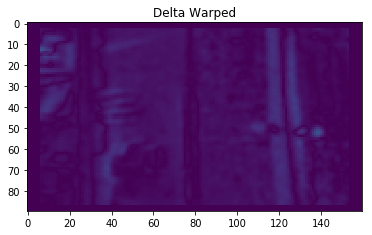

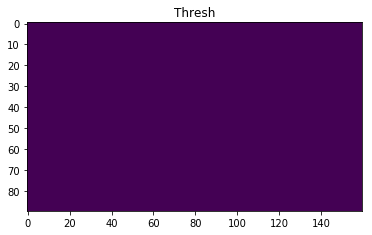

--IMAGE--
IMU Z (RAD/S): 378.230791
DELTA_T (S): 0.090839
PHI (RAD): 0.127994
DX (PIX): 19.410106
SCORE: -54027


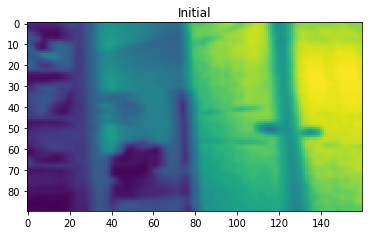

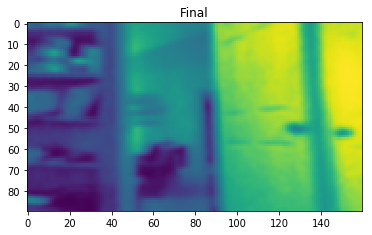

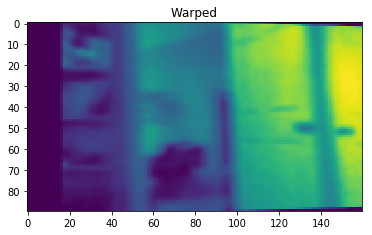

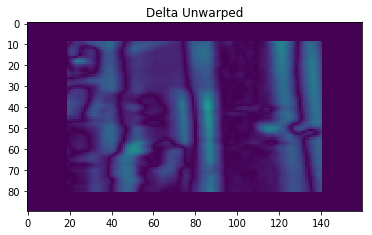

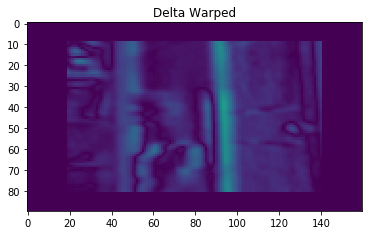

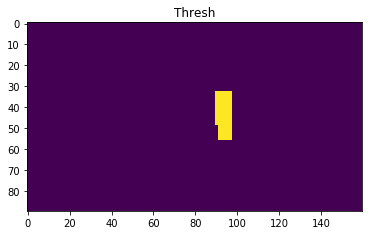

--IMAGE--
IMU Z (RAD/S): 403.394808
DELTA_T (S): 0.010374
PHI (RAD): 0.015590
DX (PIX): 2.364169
SCORE: -71973


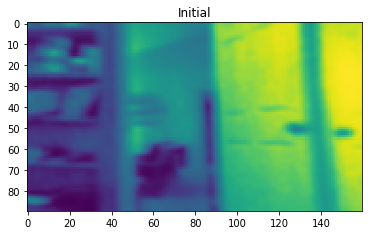

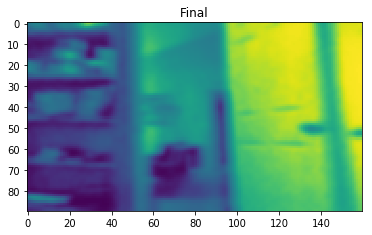

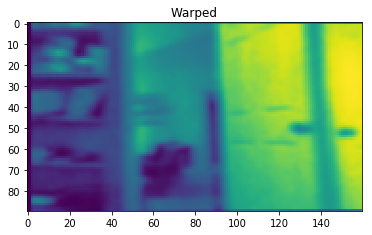

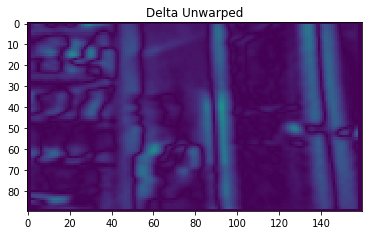

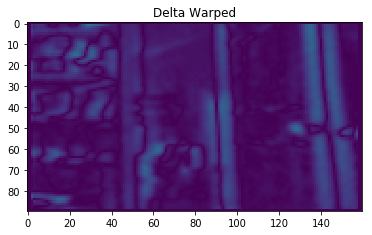

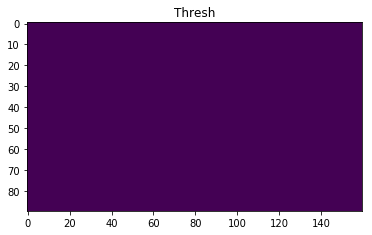

--IMAGE--
IMU Z (RAD/S): 390.526845
DELTA_T (S): 0.081612
PHI (RAD): 0.118731
DX (PIX): 18.005424
SCORE: -169642


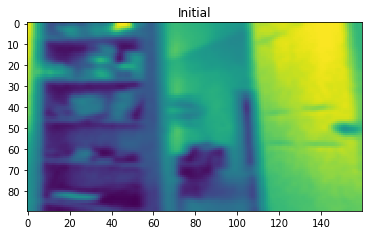

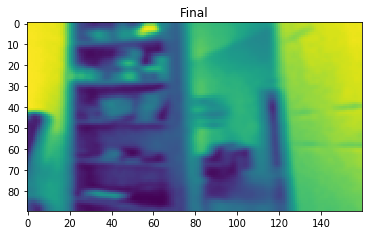

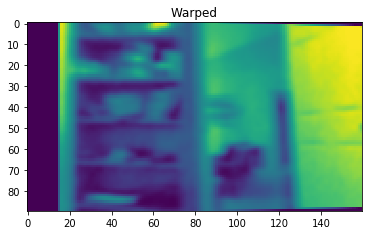

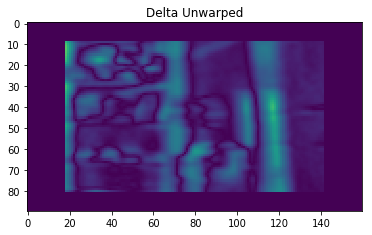

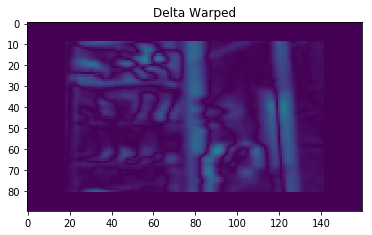

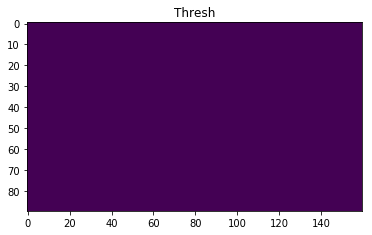

--IMAGE--
IMU Z (RAD/S): 356.212276
DELTA_T (S): 0.018401
PHI (RAD): 0.024418
DX (PIX): 3.702945
SCORE: -171748


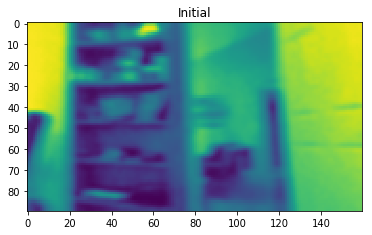

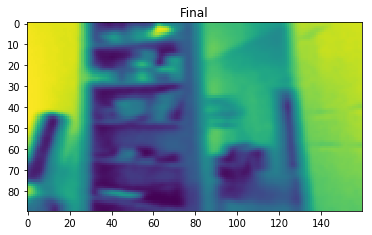

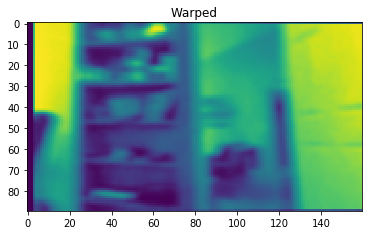

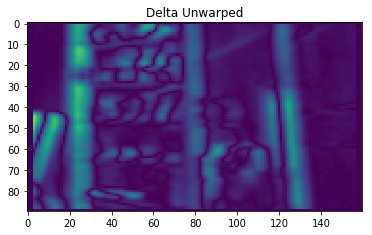

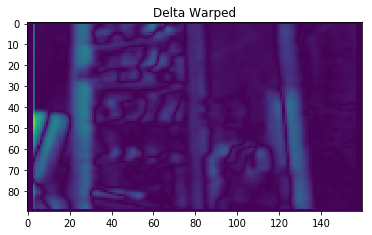

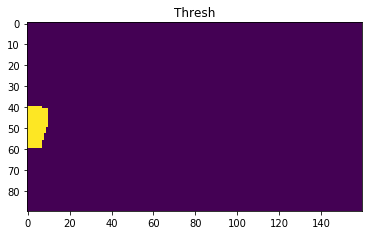

--IMAGE--
IMU Z (RAD/S): 360.215642
DELTA_T (S): 0.033737
PHI (RAD): 0.045273
DX (PIX): 6.865522
SCORE: -334410


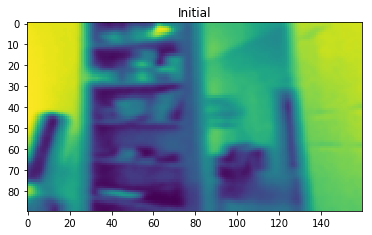

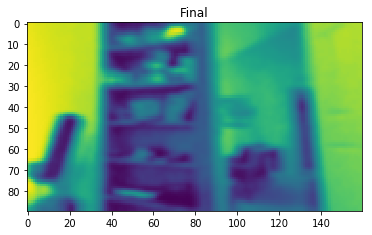

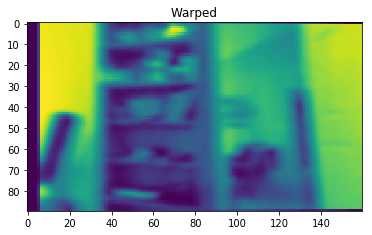

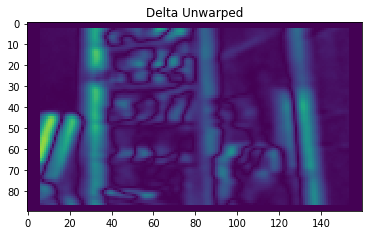

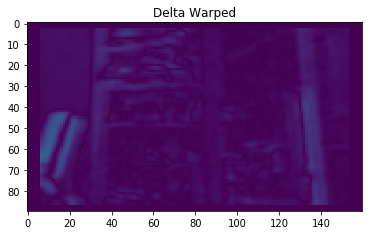

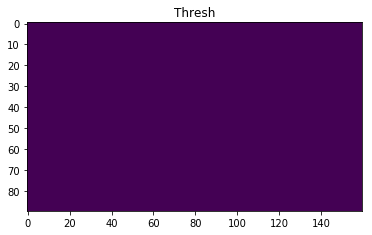

--IMAGE--
IMU Z (RAD/S): 370.224058
DELTA_T (S): 0.032501
PHI (RAD): 0.044825
DX (PIX): 6.797722
SCORE: -172635


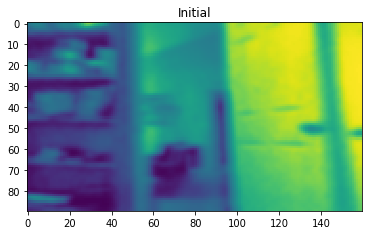

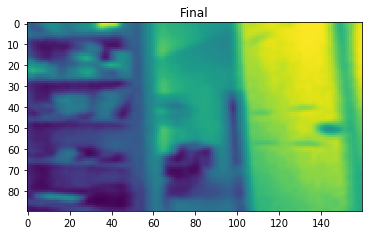

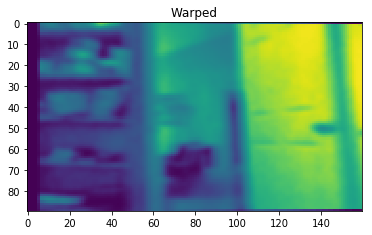

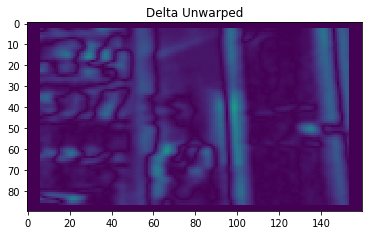

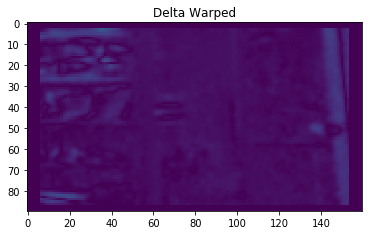

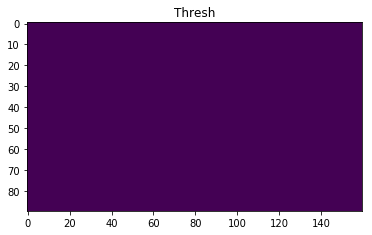

--IMAGE--
IMU Z (RAD/S): 383.663931
DELTA_T (S): 0.032526
PHI (RAD): 0.046489
DX (PIX): 7.049971
SCORE: -338750


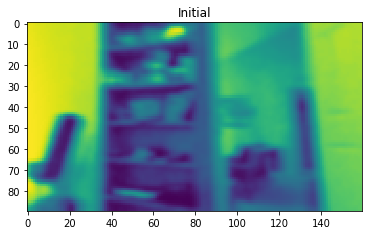

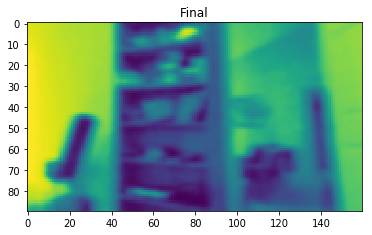

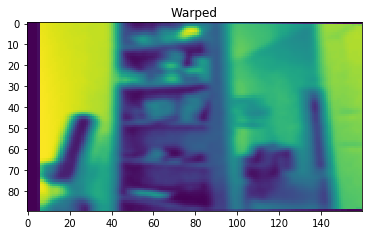

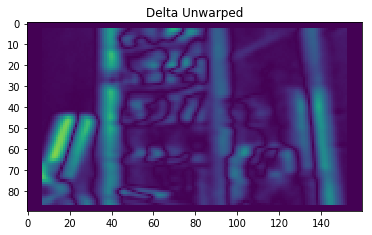

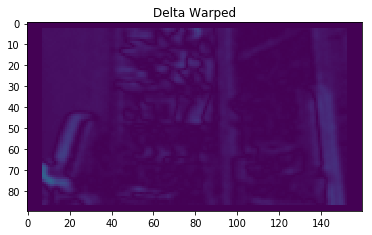

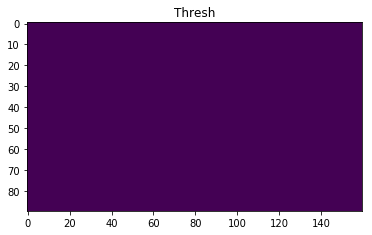

--IMAGE--
IMU Z (RAD/S): 365.362827
DELTA_T (S): 0.090934
PHI (RAD): 0.123768
DX (PIX): 18.769283
SCORE: -201944


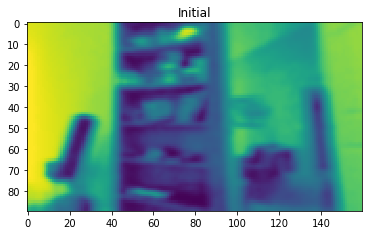

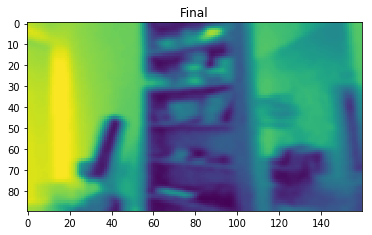

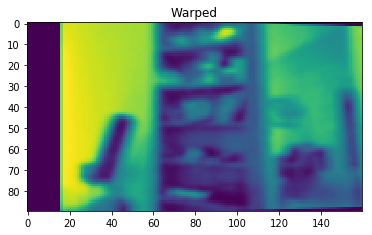

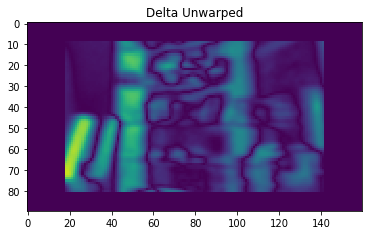

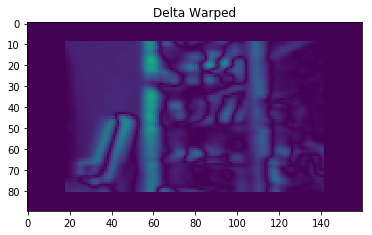

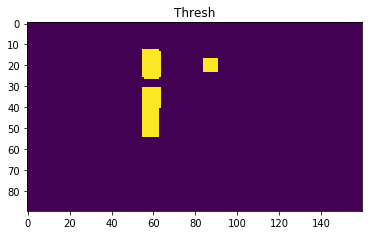

--IMAGE--
IMU Z (RAD/S): 367.936420
DELTA_T (S): 0.033758
PHI (RAD): 0.046271
DX (PIX): 7.016988
SCORE: -218289


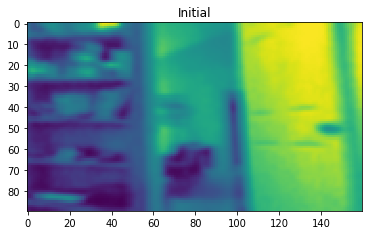

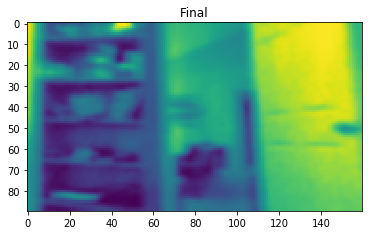

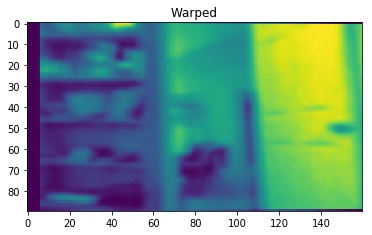

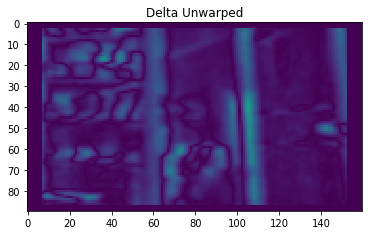

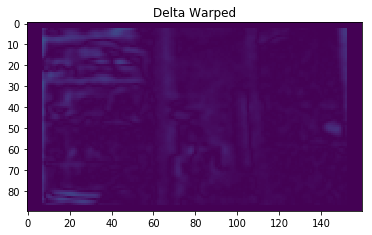

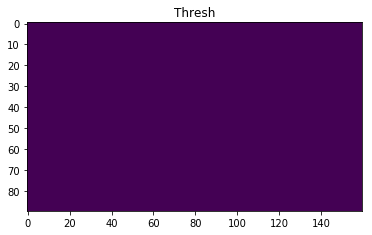

--IMAGE--
IMU Z (RAD/S): 162.049004
DELTA_T (S): 0.033798
PHI (RAD): 0.020403
DX (PIX): 3.094092
SCORE: 123721


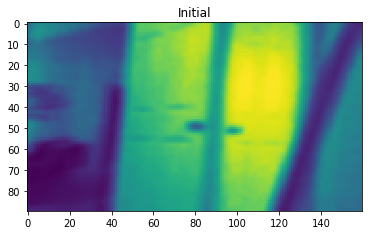

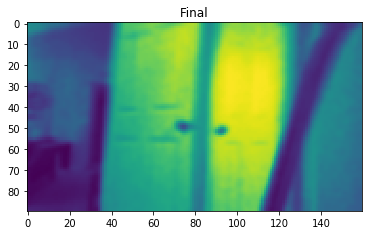

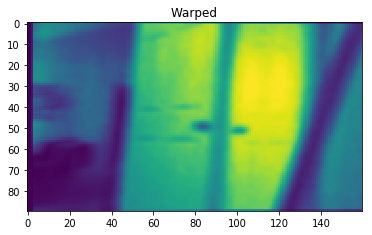

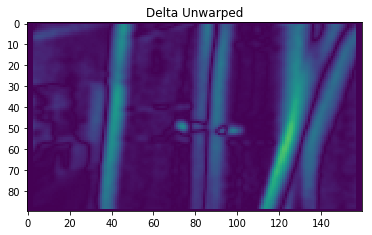

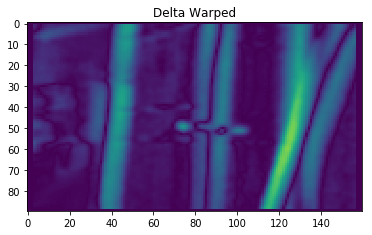

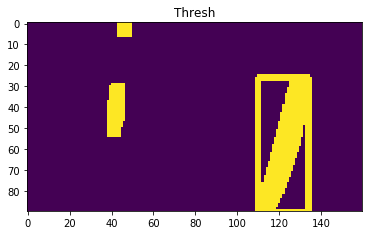

--IMAGE--
IMU Z (RAD/S): 83.125494
DELTA_T (S): 0.033671
PHI (RAD): 0.010427
DX (PIX): 1.581205
SCORE: 38065


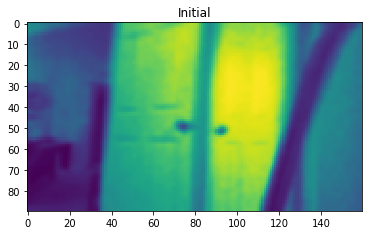

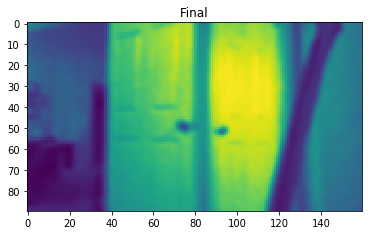

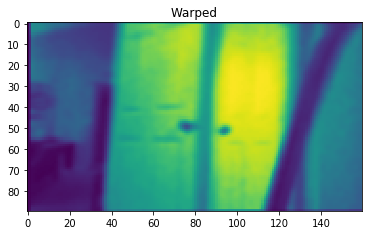

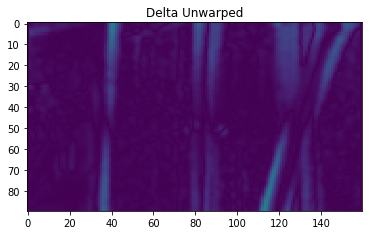

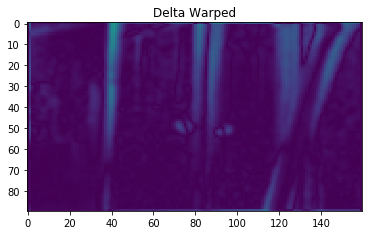

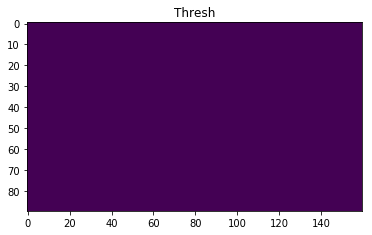

--IMAGE--
IMU Z (RAD/S): 250.409020
DELTA_T (S): 0.032439
PHI (RAD): 0.030261
DX (PIX): 4.589017
SCORE: 201588


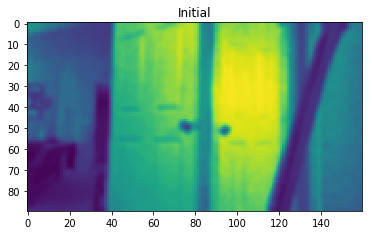

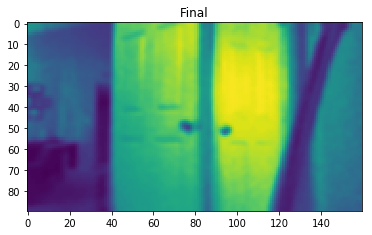

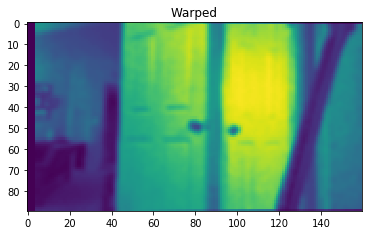

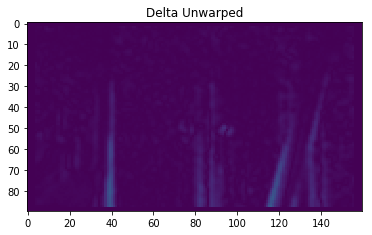

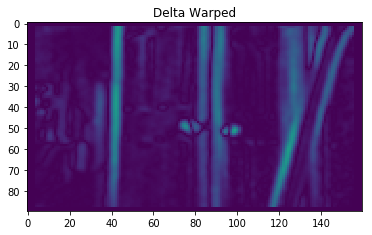

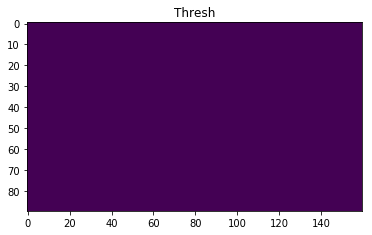

--IMAGE--
IMU Z (RAD/S): 517.776706
DELTA_T (S): 0.033793
PHI (RAD): 0.065182
DX (PIX): 9.884803
SCORE: -105009


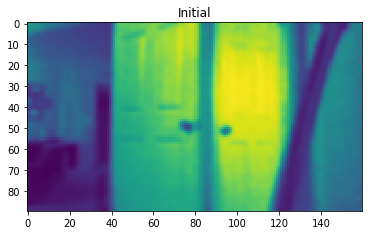

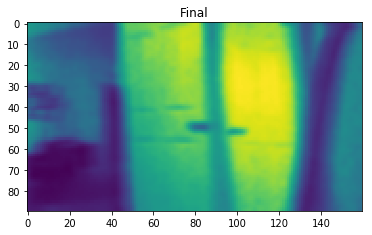

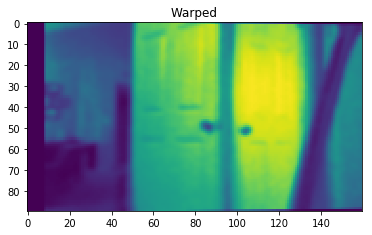

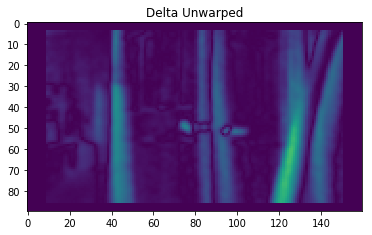

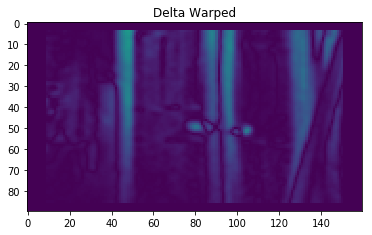

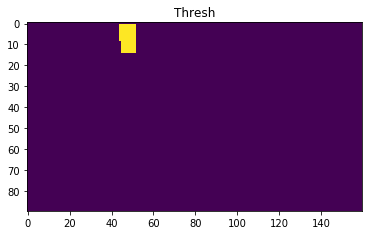

--IMAGE--
IMU Z (RAD/S): 419.980184
DELTA_T (S): 0.033724
PHI (RAD): 0.052762
DX (PIX): 8.001322
SCORE: -334729


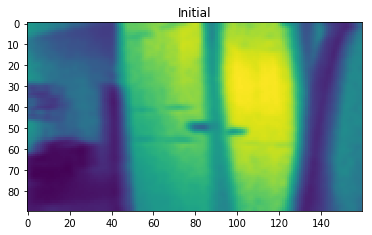

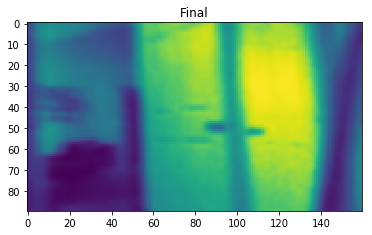

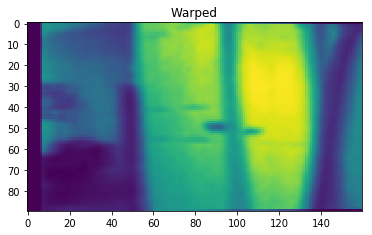

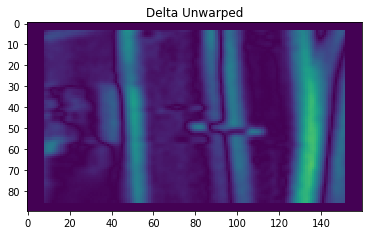

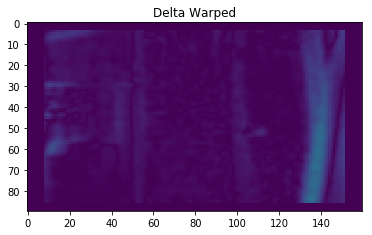

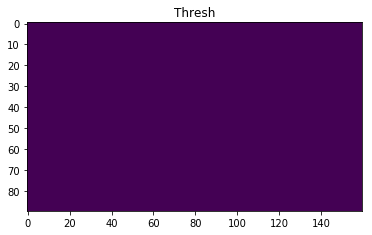

--IMAGE--
IMU Z (RAD/S): 274.715173
DELTA_T (S): 0.033746
PHI (RAD): 0.034535
DX (PIX): 5.237186
SCORE: -235724


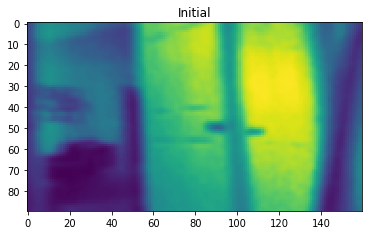

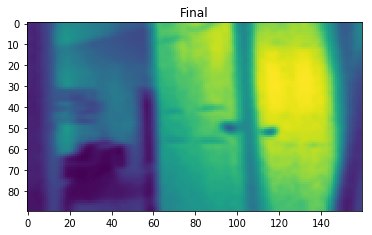

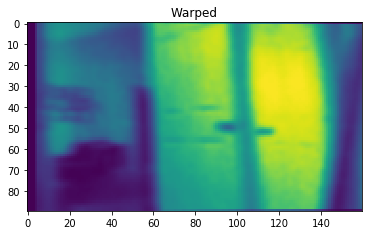

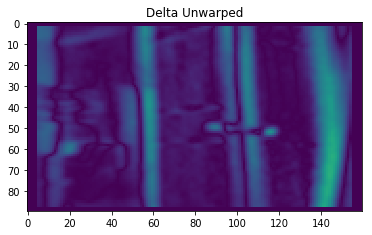

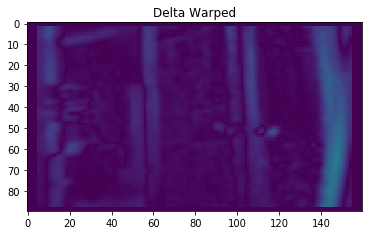

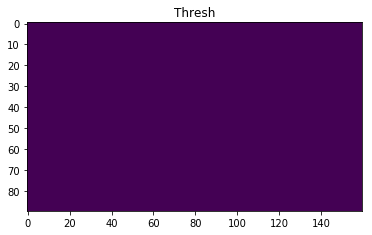

--IMAGE--
IMU Z (RAD/S): 297.305598
DELTA_T (S): 0.032523
PHI (RAD): 0.036021
DX (PIX): 5.462543
SCORE: -248470


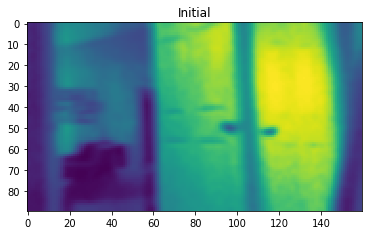

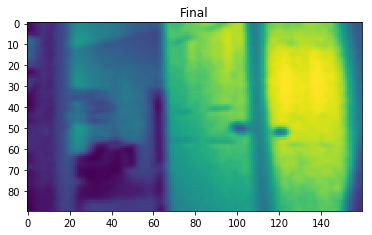

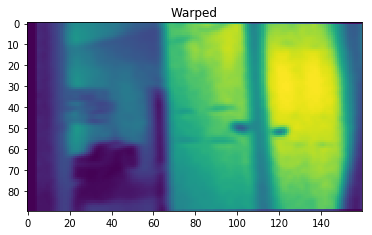

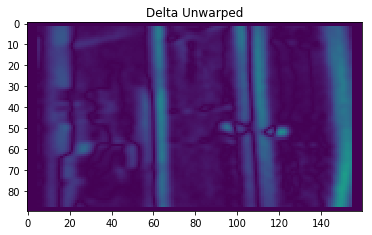

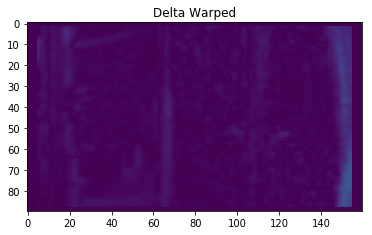

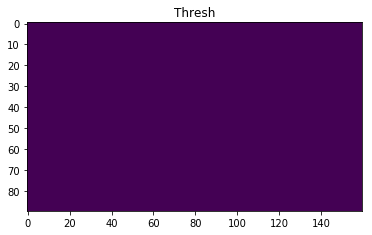

--IMAGE--
IMU Z (RAD/S): 440.568925
DELTA_T (S): 0.033833
PHI (RAD): 0.055529
DX (PIX): 8.420869
SCORE: -150851


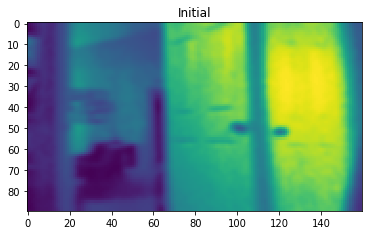

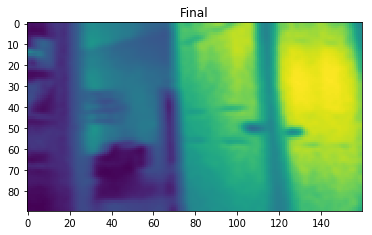

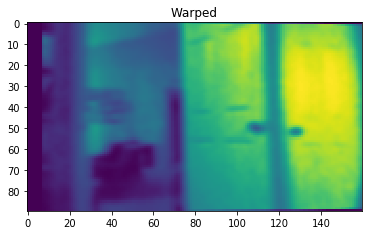

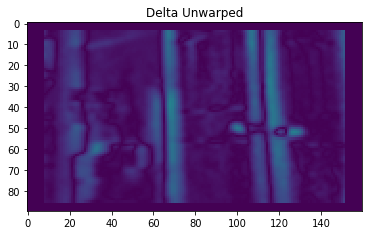

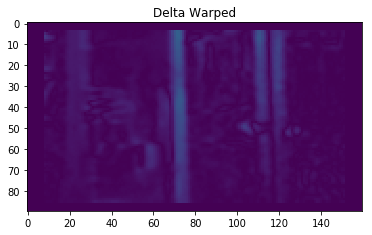

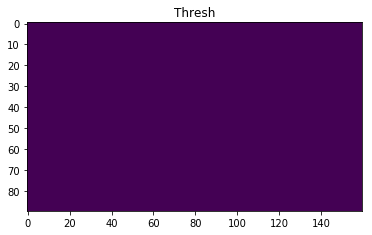

--IMAGE--
IMU Z (RAD/S): 346.775769
DELTA_T (S): 0.032475
PHI (RAD): 0.041953
DX (PIX): 6.362142
SCORE: -157156


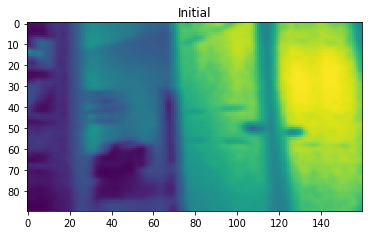

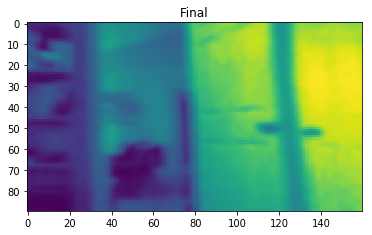

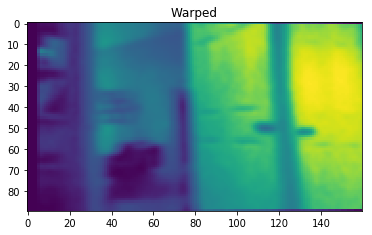

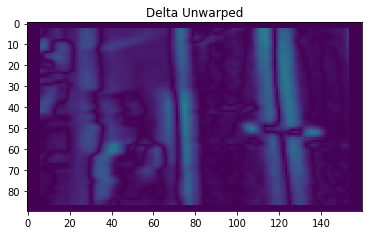

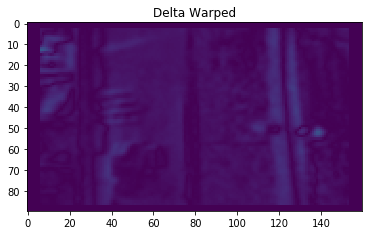

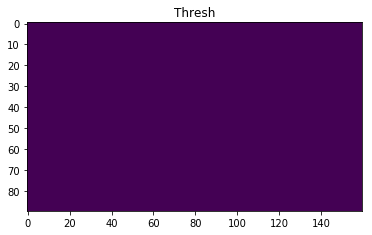

--IMAGE--
IMU Z (RAD/S): 372.797651
DELTA_T (S): 0.092771
PHI (RAD): 0.128839
DX (PIX): 19.538210
SCORE: -48258


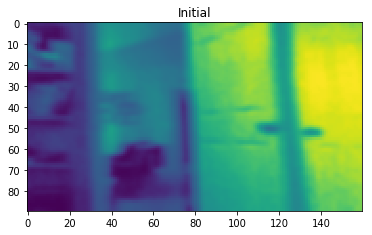

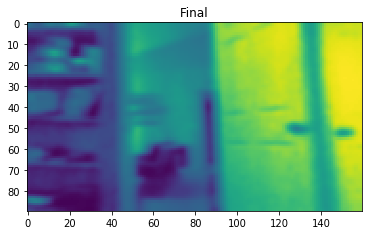

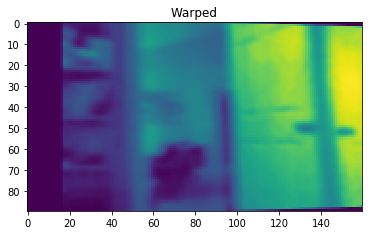

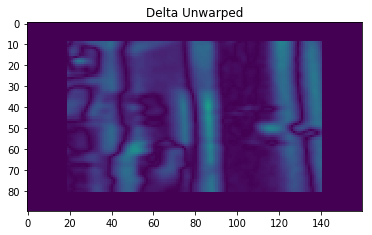

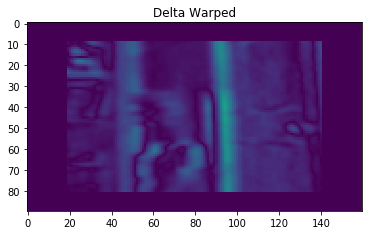

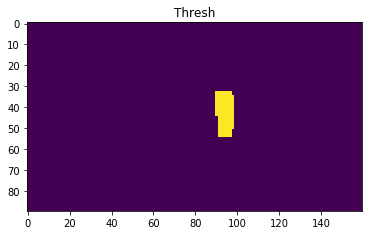

--IMAGE--
IMU Z (RAD/S): 381.662248
DELTA_T (S): 0.008417
PHI (RAD): 0.011967
DX (PIX): 1.814754
SCORE: -46631


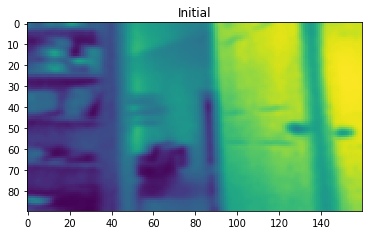

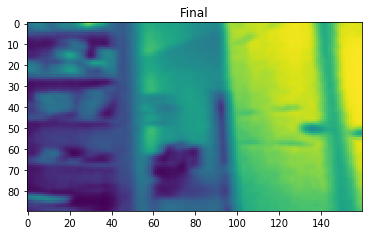

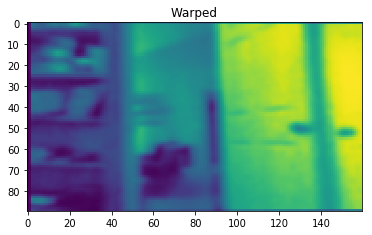

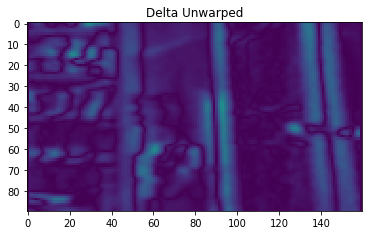

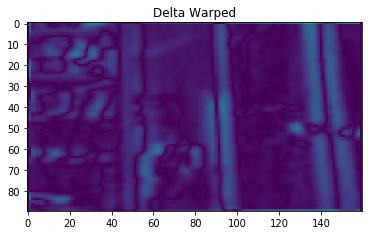

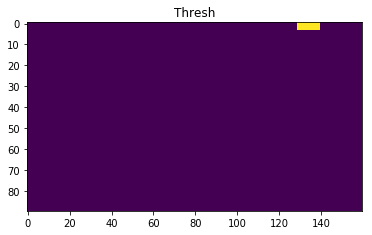

--IMAGE--
IMU Z (RAD/S): 396.245940
DELTA_T (S): 0.093783
PHI (RAD): 0.138436
DX (PIX): 20.993687
SCORE: -71822


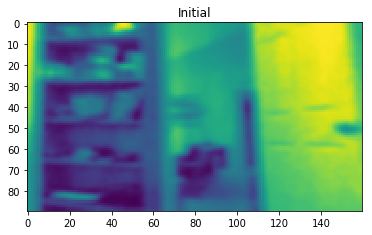

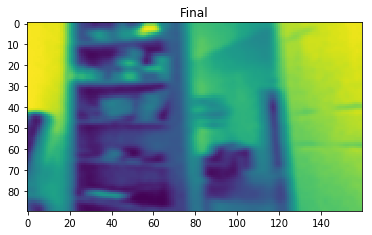

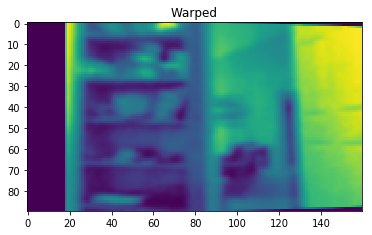

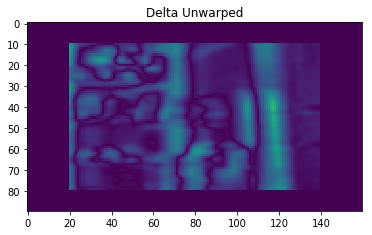

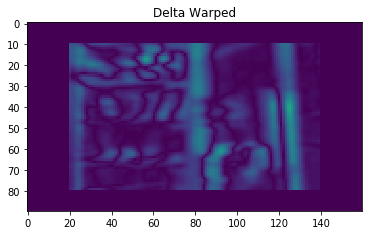

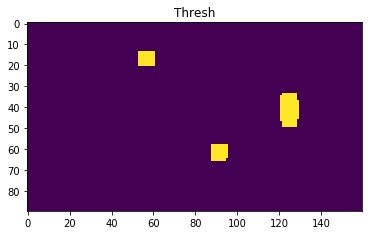

--IMAGE--
IMU Z (RAD/S): 352.494864
DELTA_T (S): 0.033734
PHI (RAD): 0.044298
DX (PIX): 6.717703
SCORE: -332711


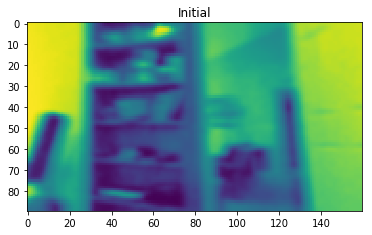

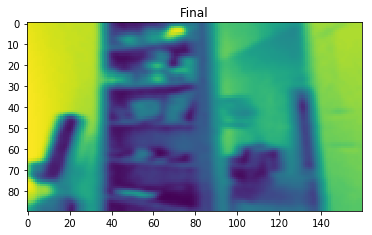

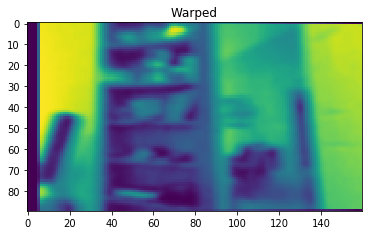

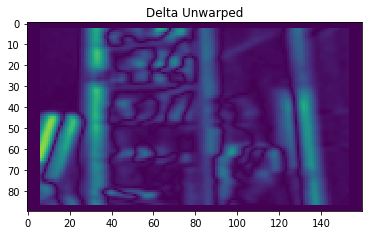

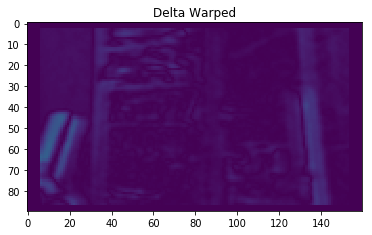

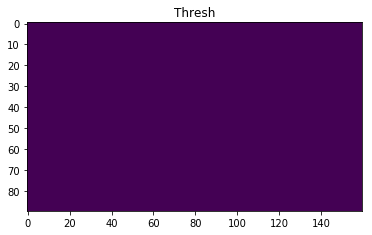

--IMAGE--
IMU Z (RAD/S): 339.054991
DELTA_T (S): 0.032642
PHI (RAD): 0.041229
DX (PIX): 6.252368
SCORE: -174332


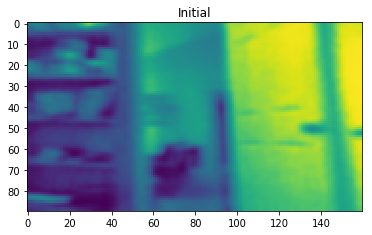

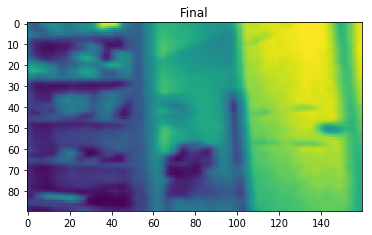

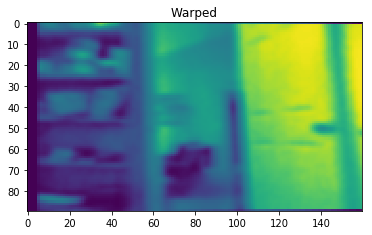

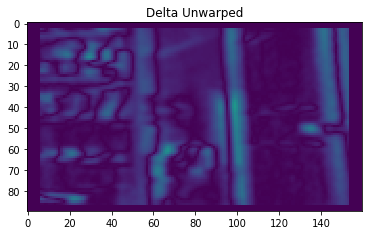

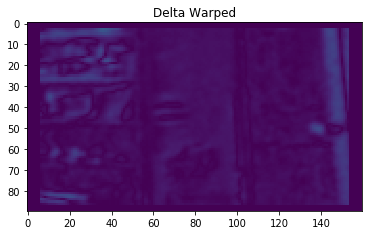

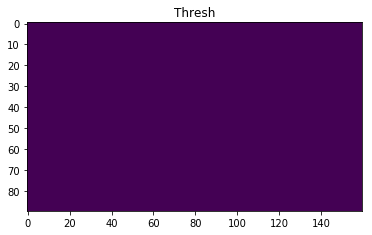

--IMAGE--
IMU Z (RAD/S): 371.367877
DELTA_T (S): 0.032490
PHI (RAD): 0.044949
DX (PIX): 6.816423
SCORE: -342612


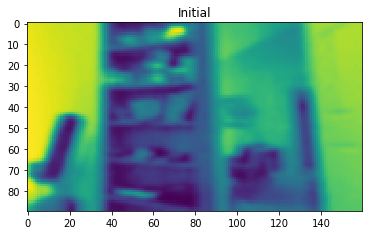

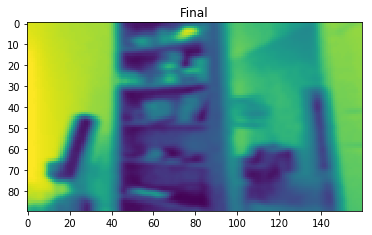

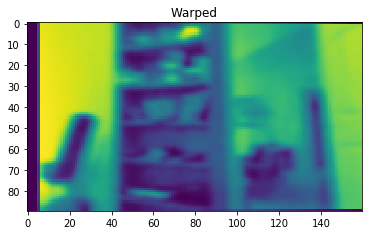

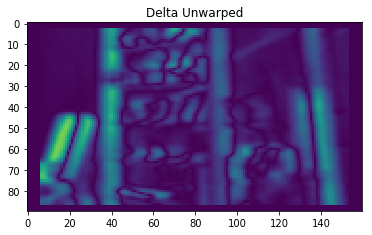

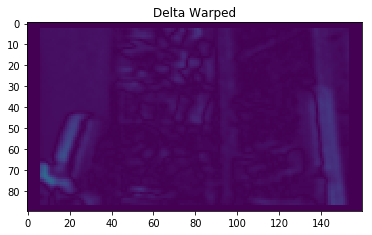

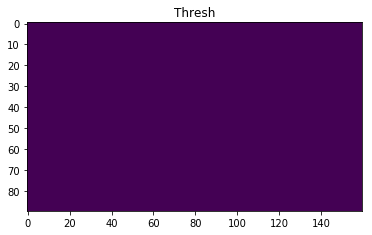

--IMAGE--
IMU Z (RAD/S): 362.789235
DELTA_T (S): 0.090145
PHI (RAD): 0.121830
DX (PIX): 18.475429
SCORE: -207047


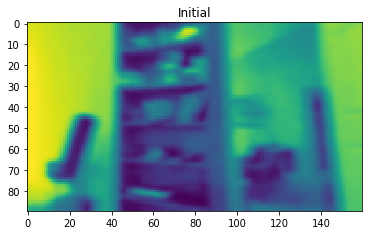

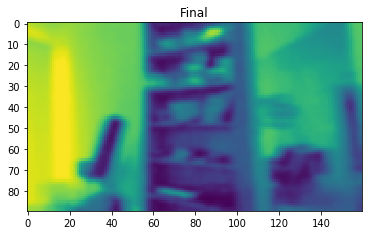

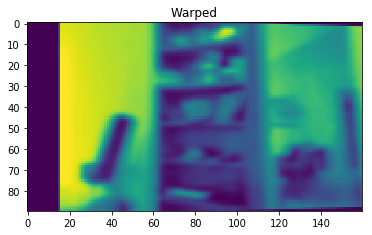

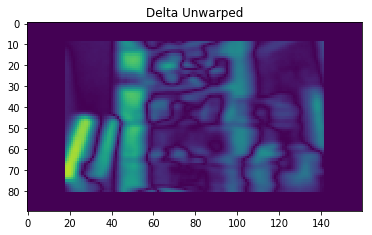

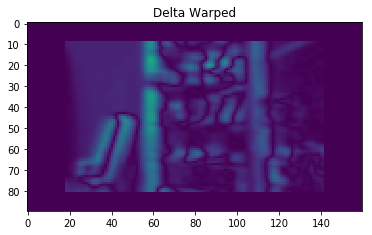

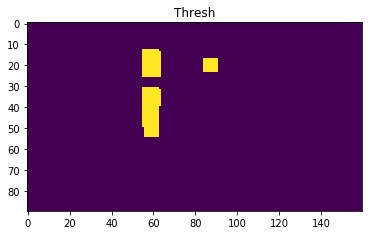

--IMAGE--
IMU Z (RAD/S): 367.078556
DELTA_T (S): 0.033586
PHI (RAD): 0.045928
DX (PIX): 6.964979
SCORE: -213857


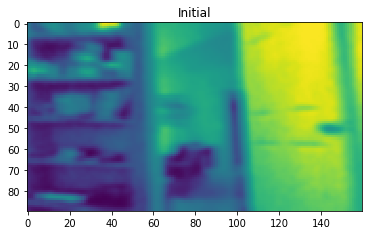

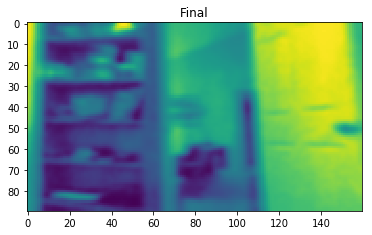

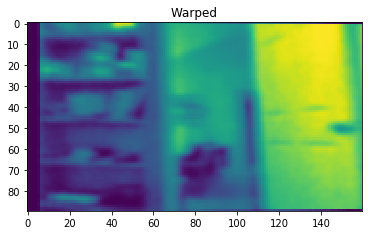

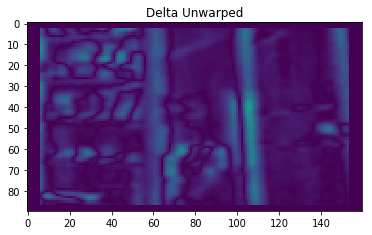

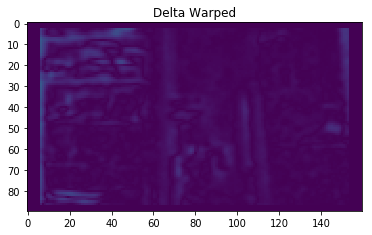

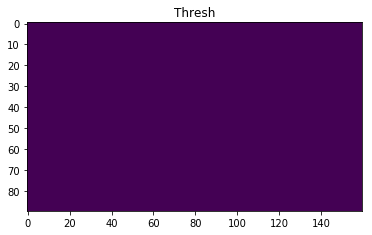

--IMAGE--
IMU Z (RAD/S): 206.086035
DELTA_T (S): 0.031041
PHI (RAD): 0.023831
DX (PIX): 3.613922
SCORE: 147032


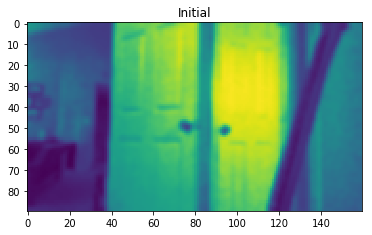

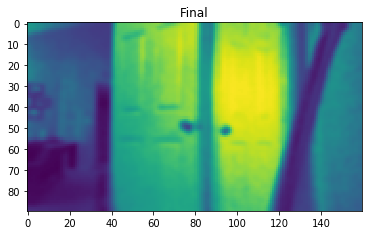

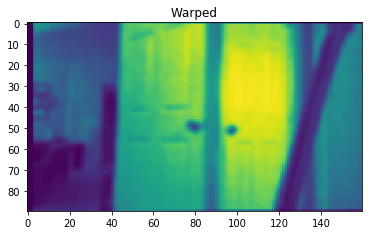

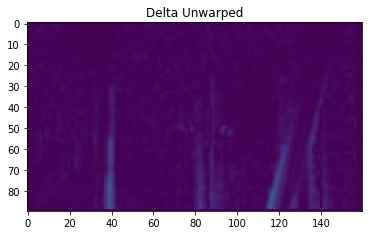

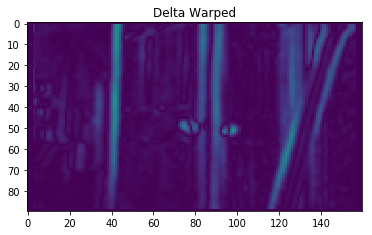

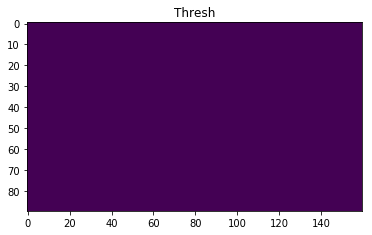

--IMAGE--
IMU Z (RAD/S): 511.771657
DELTA_T (S): 0.033920
PHI (RAD): 0.064669
DX (PIX): 9.806971
SCORE: -103991


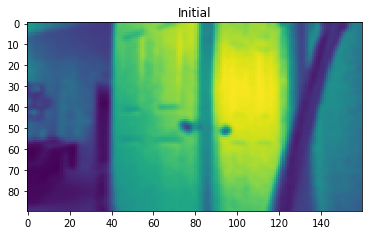

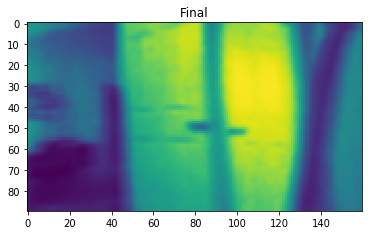

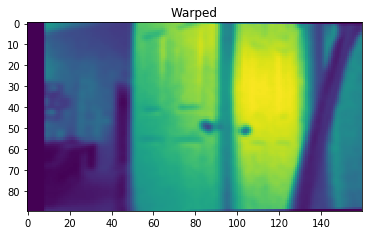

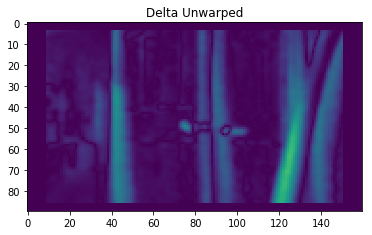

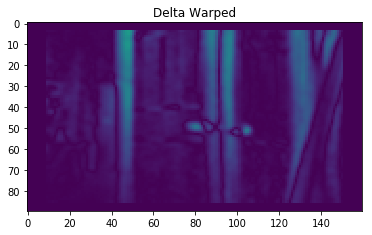

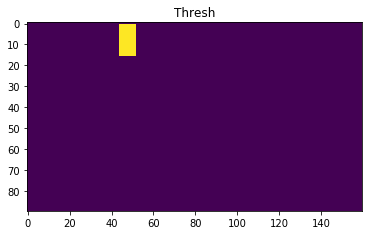

--IMAGE--
IMU Z (RAD/S): 434.849830
DELTA_T (S): 0.033604
PHI (RAD): 0.054437
DX (PIX): 8.255328
SCORE: -344745


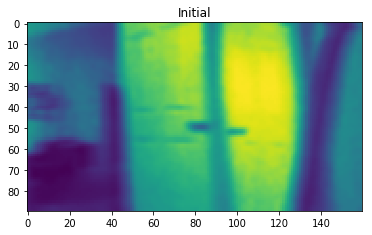

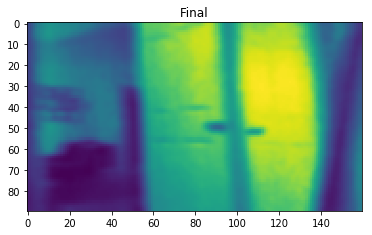

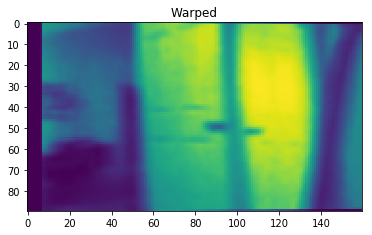

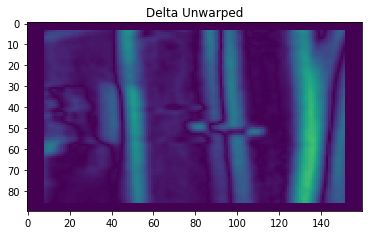

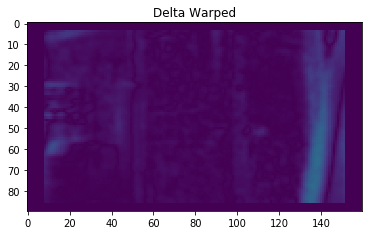

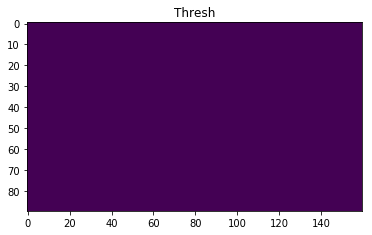

--IMAGE--
IMU Z (RAD/S): 272.713490
DELTA_T (S): 0.033715
PHI (RAD): 0.034253
DX (PIX): 5.194361
SCORE: -233666


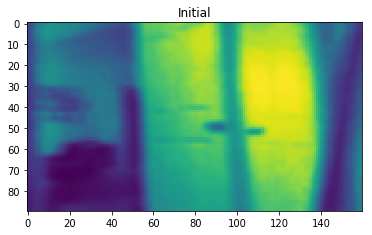

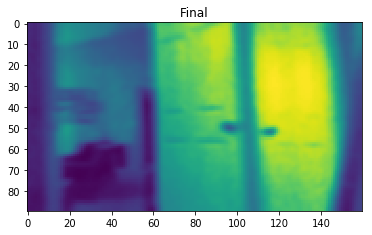

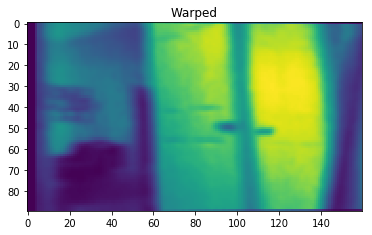

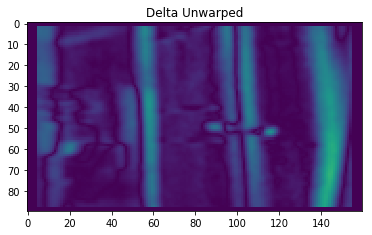

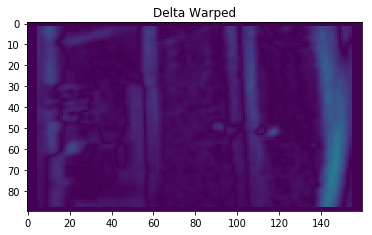

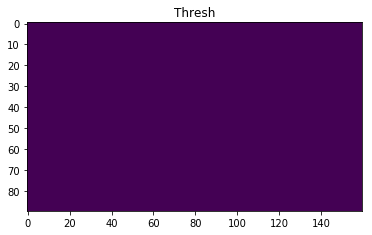

--IMAGE--
IMU Z (RAD/S): 281.578087
DELTA_T (S): 0.032506
PHI (RAD): 0.034098
DX (PIX): 5.170881
SCORE: -242480


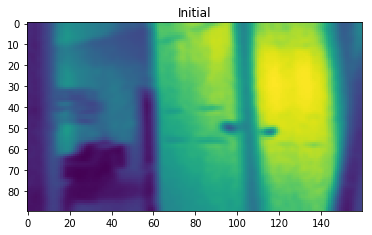

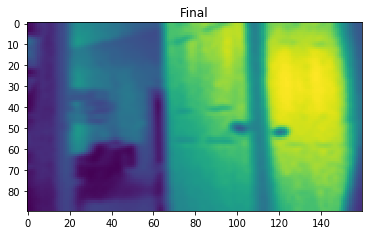

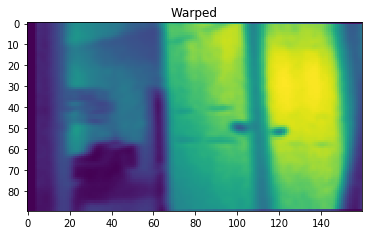

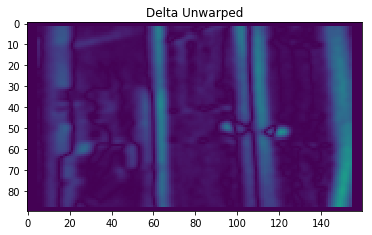

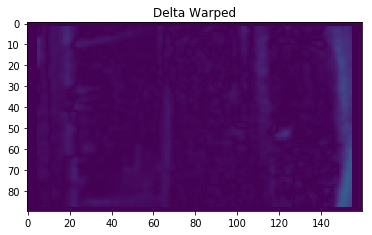

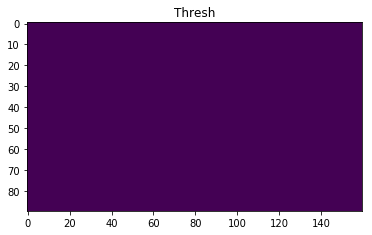

--IMAGE--
IMU Z (RAD/S): 445.144201
DELTA_T (S): 0.034193
PHI (RAD): 0.056702
DX (PIX): 8.598854
SCORE: -142109


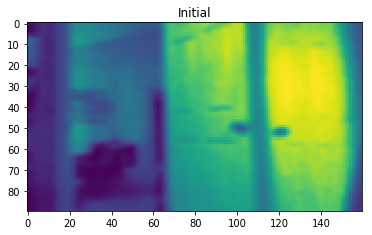

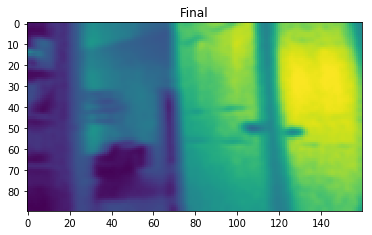

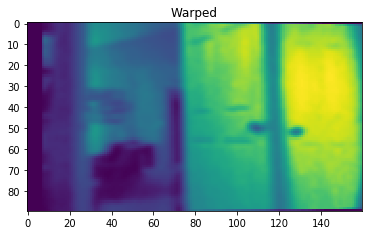

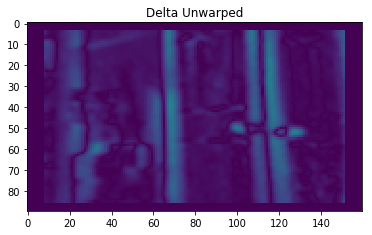

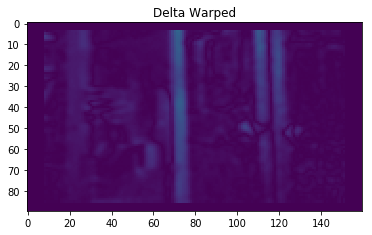

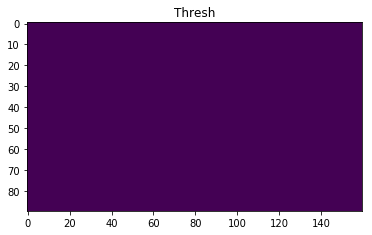

--IMAGE--
IMU Z (RAD/S): 343.916222
DELTA_T (S): 0.032143
PHI (RAD): 0.041181
DX (PIX): 6.245105
SCORE: -154272


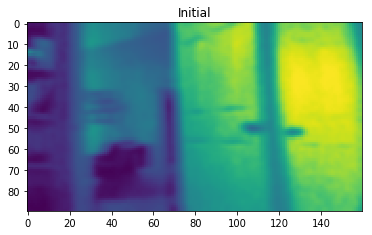

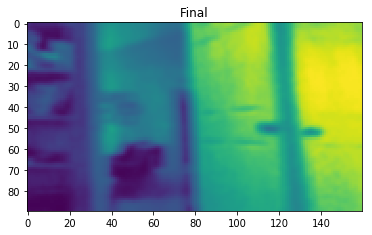

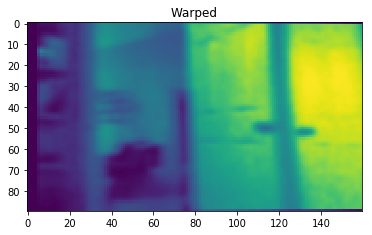

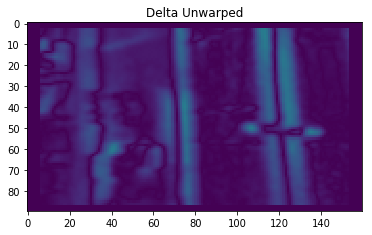

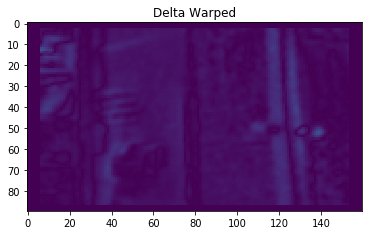

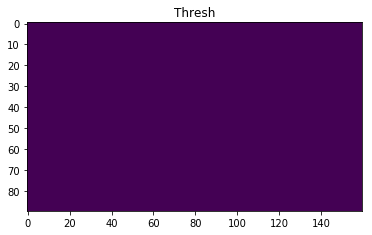

--IMAGE--
IMU Z (RAD/S): 361.931370
DELTA_T (S): 0.092954
PHI (RAD): 0.125330
DX (PIX): 19.006151
SCORE: -59339


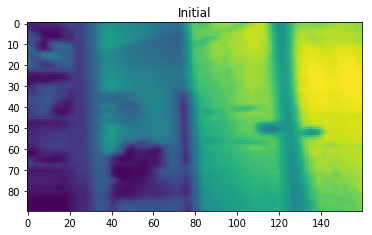

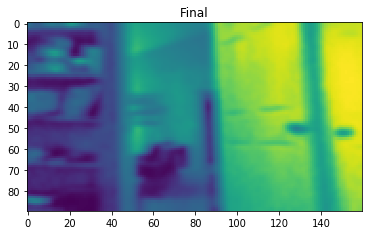

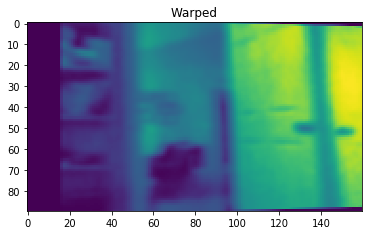

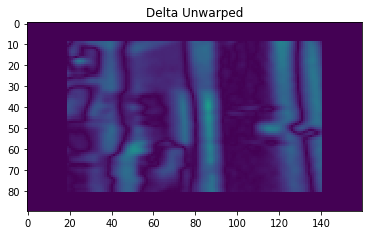

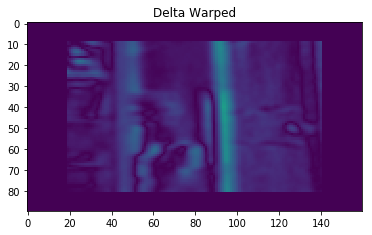

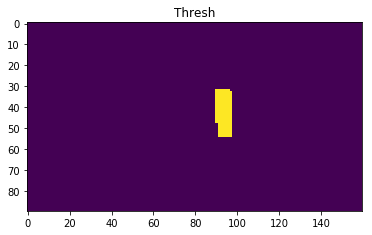

--IMAGE--
IMU Z (RAD/S): 381.090338
DELTA_T (S): 0.008316
PHI (RAD): 0.011806
DX (PIX): 1.790425
SCORE: -45218


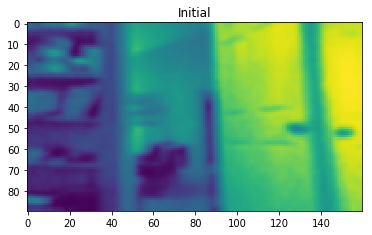

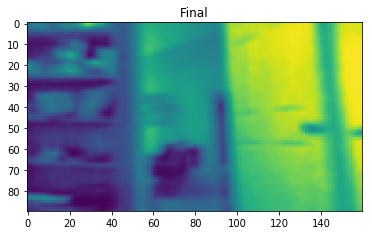

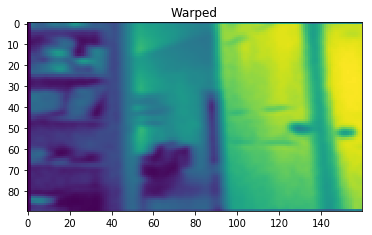

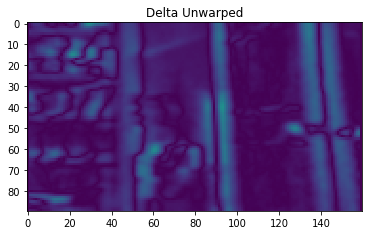

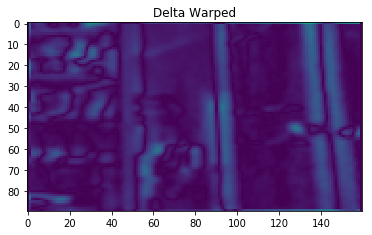

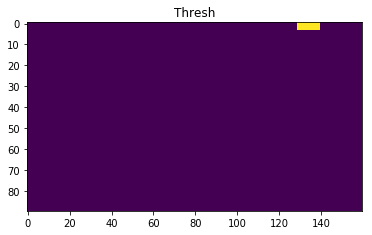

--IMAGE--
IMU Z (RAD/S): 399.391442
DELTA_T (S): 0.099993
PHI (RAD): 0.148774
DX (PIX): 22.561418
SCORE: -262347


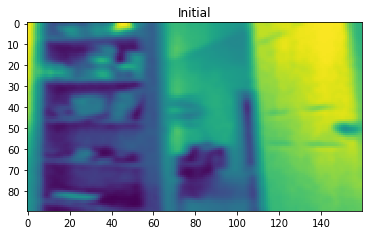

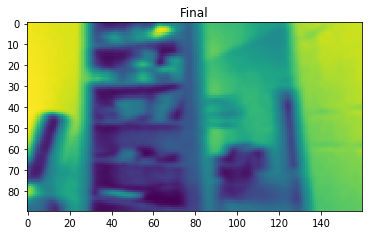

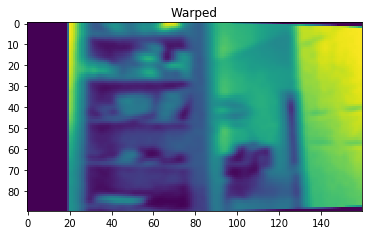

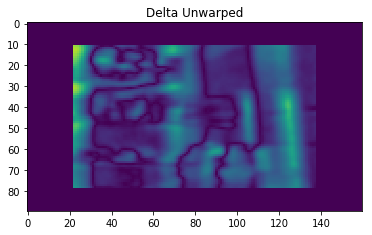

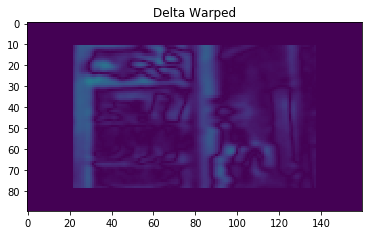

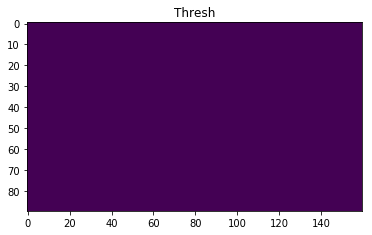

--IMAGE--
IMU Z (RAD/S): 363.361144
DELTA_T (S): 0.033677
PHI (RAD): 0.045587
DX (PIX): 6.913140
SCORE: -337168


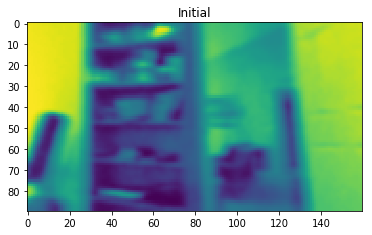

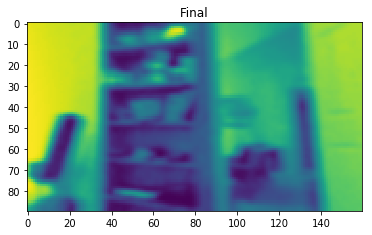

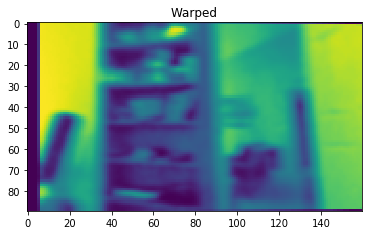

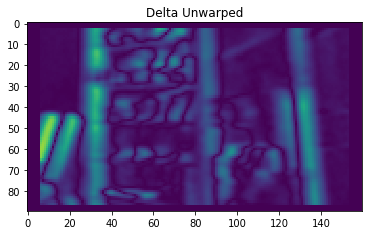

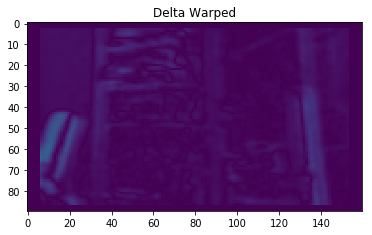

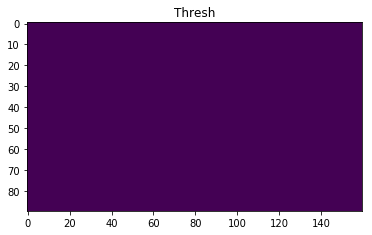

--IMAGE--
IMU Z (RAD/S): 345.060040
DELTA_T (S): 0.032445
PHI (RAD): 0.041706
DX (PIX): 6.324715
SCORE: -173492


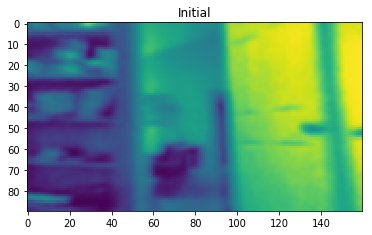

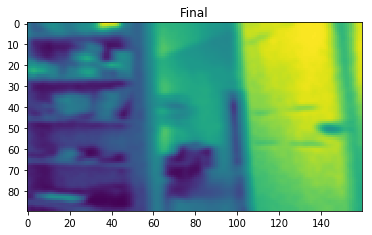

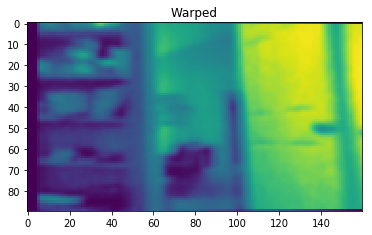

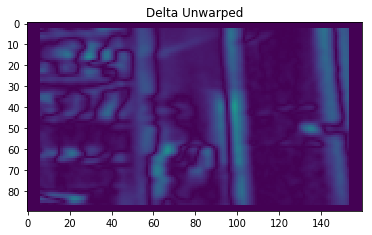

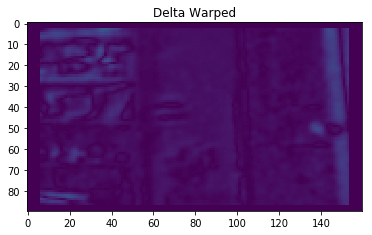

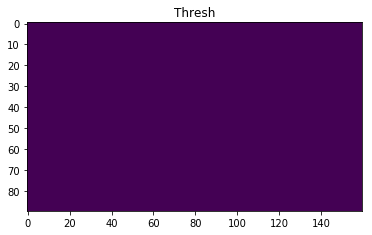

--IMAGE--
IMU Z (RAD/S): 369.938103
DELTA_T (S): 0.032481
PHI (RAD): 0.044763
DX (PIX): 6.788287
SCORE: -343880


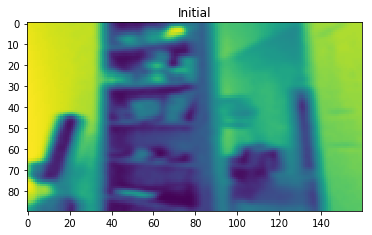

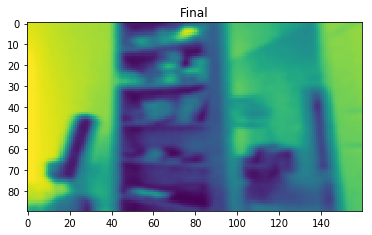

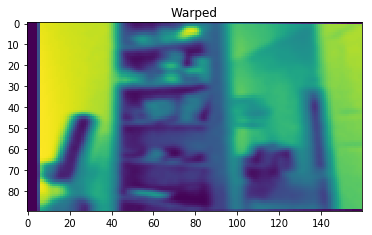

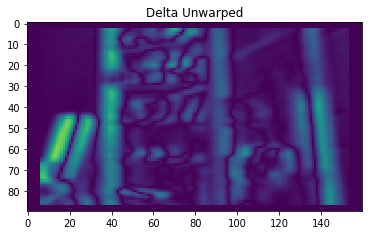

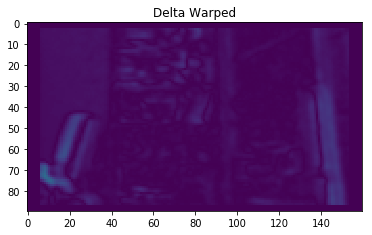

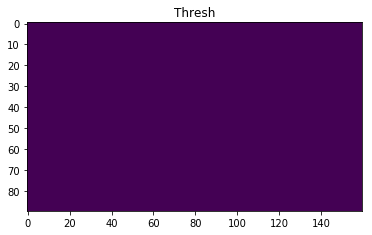

--IMAGE--
IMU Z (RAD/S): 363.647099
DELTA_T (S): 0.079162
PHI (RAD): 0.107240
DX (PIX): 16.262802
SCORE: -307736


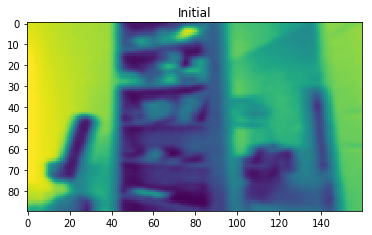

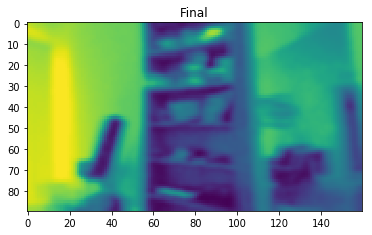

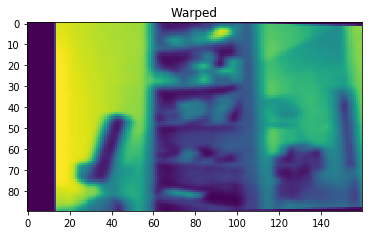

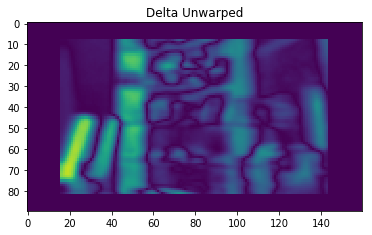

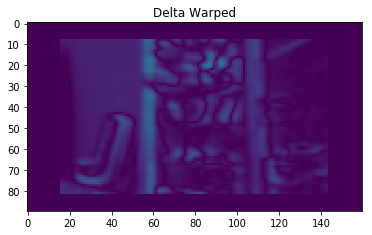

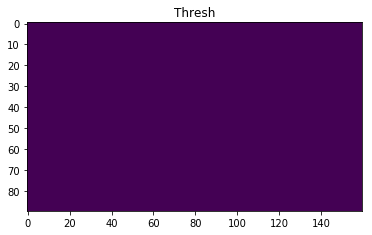

--IMAGE--
IMU Z (RAD/S): 224.959048
DELTA_T (S): 0.021115
PHI (RAD): 0.017695
DX (PIX): 2.683399
SCORE: -120376


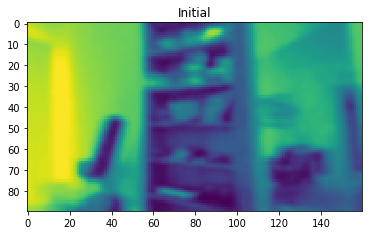

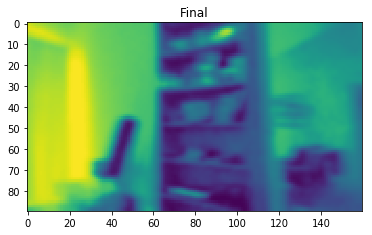

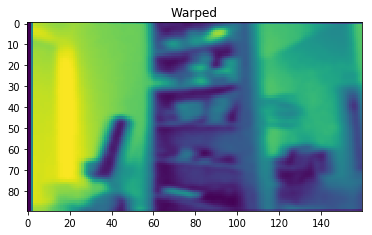

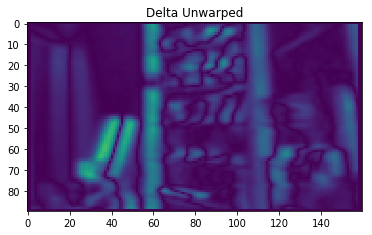

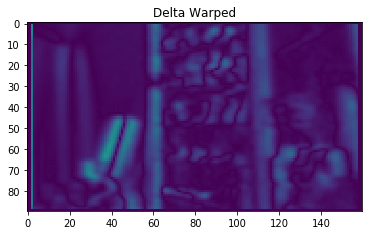

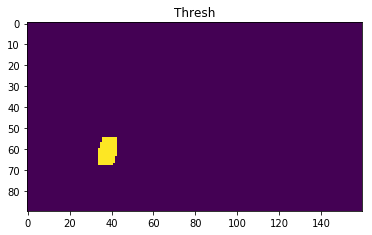

--IMAGE--
IMU Z (RAD/S): 372.511696
DELTA_T (S): 0.033800
PHI (RAD): 0.046905
DX (PIX): 7.113024
SCORE: -206513


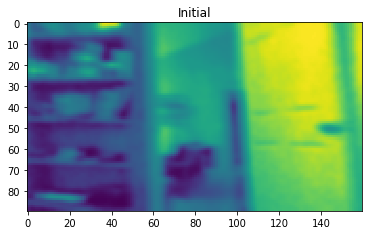

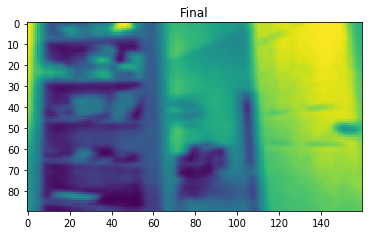

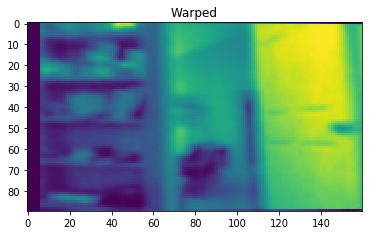

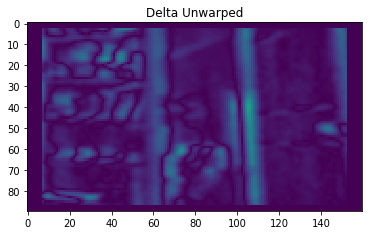

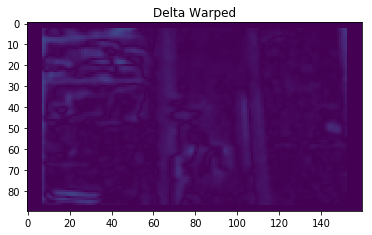

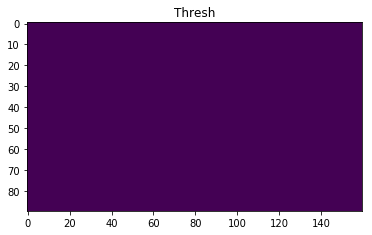

--IMAGE--
IMU Z (RAD/S): 298.735372
DELTA_T (S): 0.032497
PHI (RAD): 0.036165
DX (PIX): 5.484387
SCORE: 247916


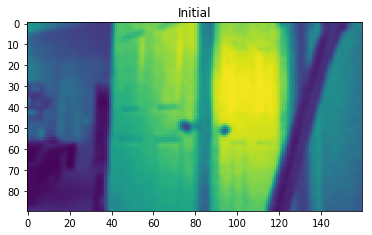

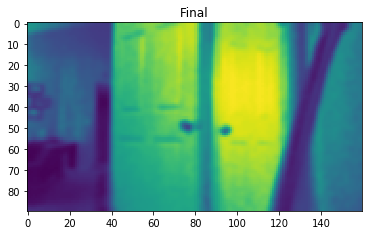

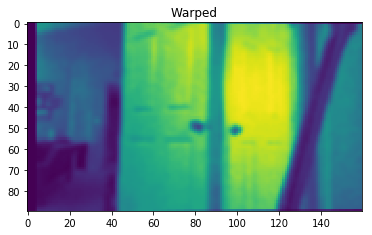

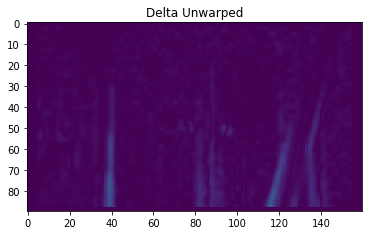

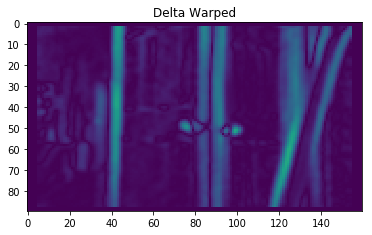

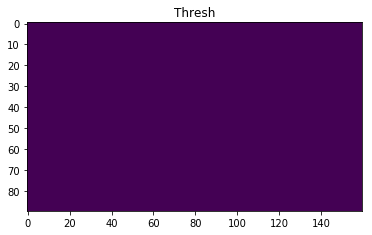

--IMAGE--
IMU Z (RAD/S): 454.294753
DELTA_T (S): 0.033753
PHI (RAD): 0.057123
DX (PIX): 8.662659
SCORE: -138772


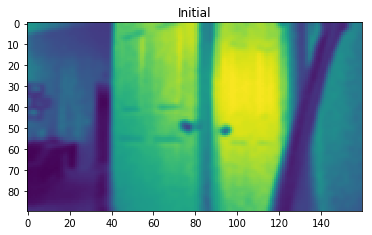

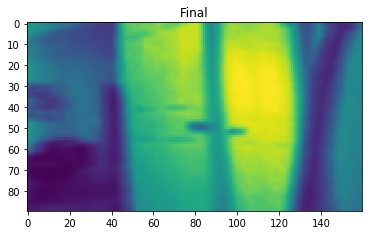

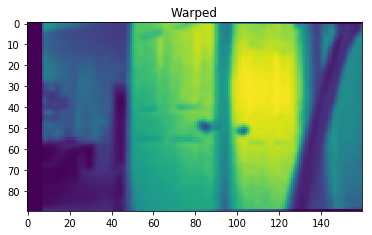

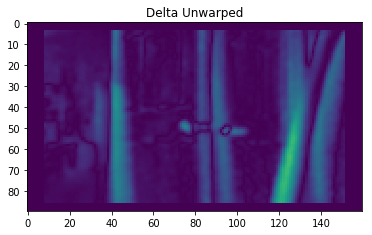

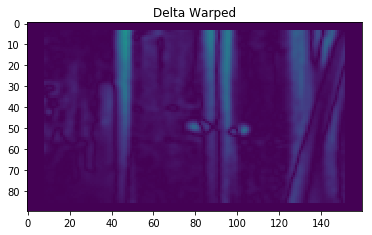

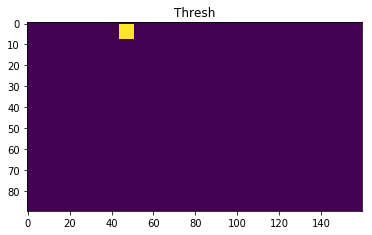

--IMAGE--
IMU Z (RAD/S): 282.149997
DELTA_T (S): 0.032514
PHI (RAD): 0.034175
DX (PIX): 5.182600
SCORE: -221568


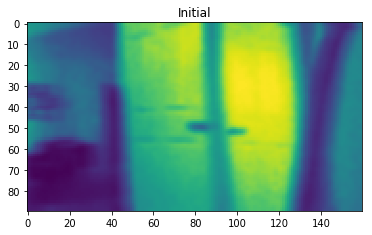

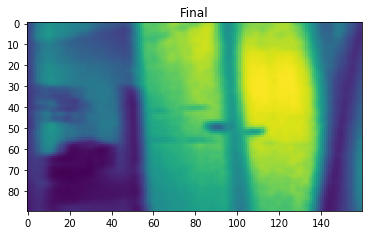

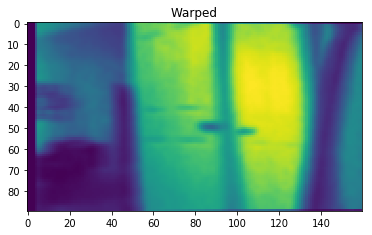

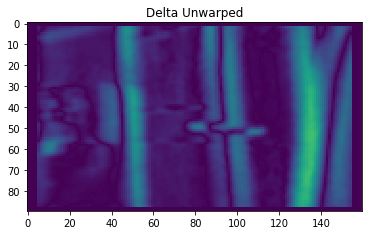

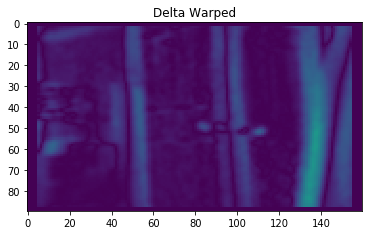

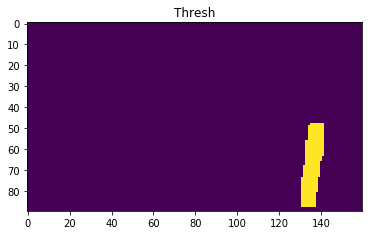

--IMAGE--
IMU Z (RAD/S): 278.432585
DELTA_T (S): 0.033724
PHI (RAD): 0.034980
DX (PIX): 5.304605
SCORE: -239087


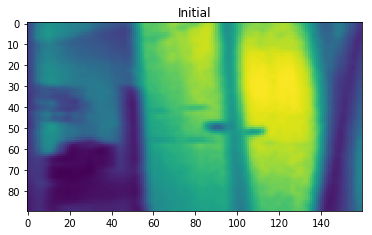

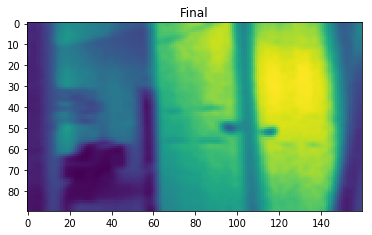

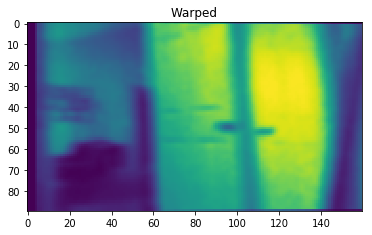

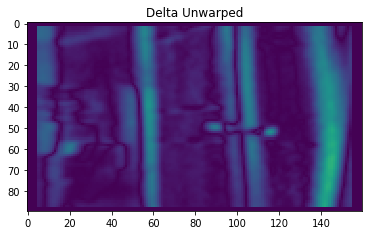

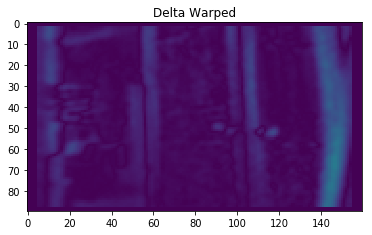

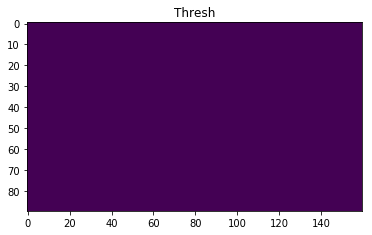

--IMAGE--
IMU Z (RAD/S): 278.432585
DELTA_T (S): 0.033744
PHI (RAD): 0.035000
DX (PIX): 5.307755
SCORE: -246557


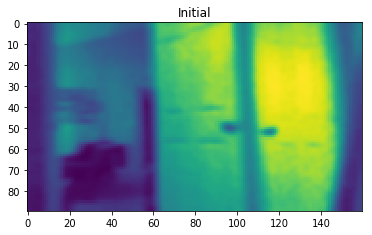

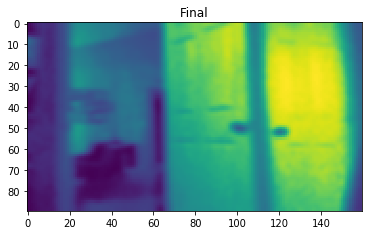

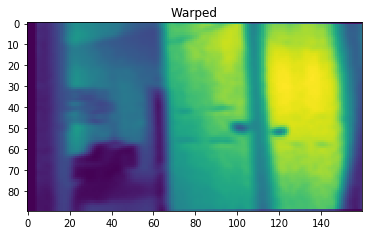

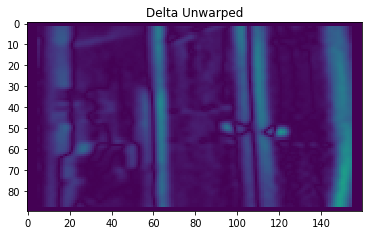

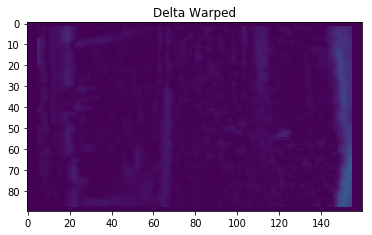

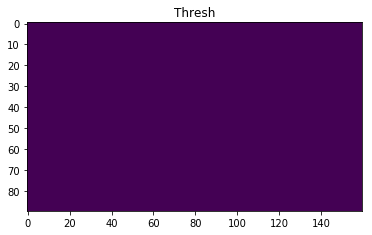

--IMAGE--
IMU Z (RAD/S): 426.271188
DELTA_T (S): 0.033714
PHI (RAD): 0.053538
DX (PIX): 8.118937
SCORE: -155510


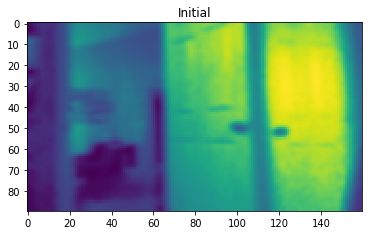

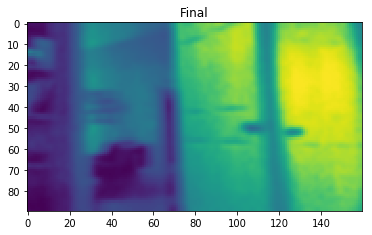

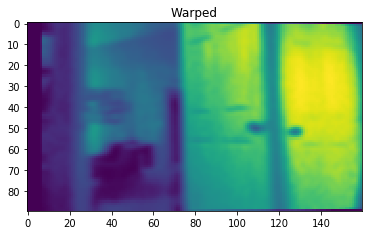

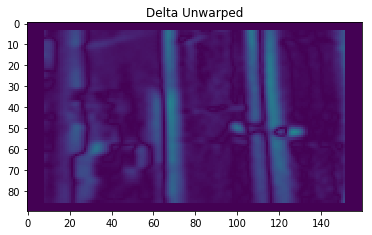

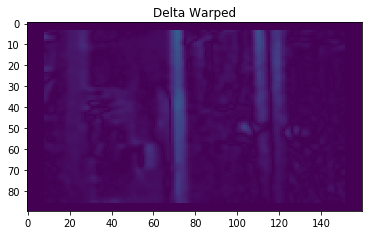

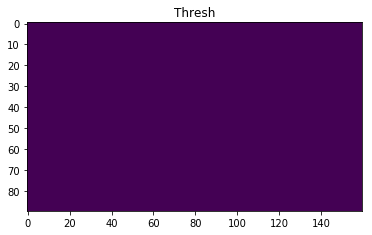

--IMAGE--
IMU Z (RAD/S): 371.367877
DELTA_T (S): 0.032540
PHI (RAD): 0.045018
DX (PIX): 6.826878
SCORE: -162160


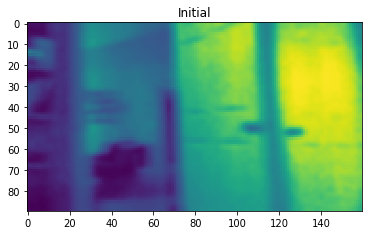

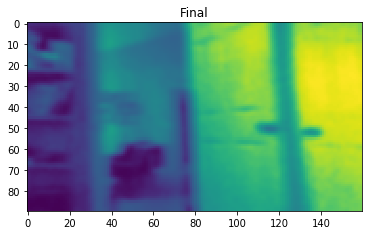

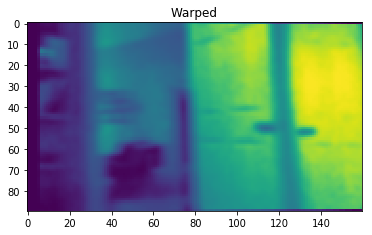

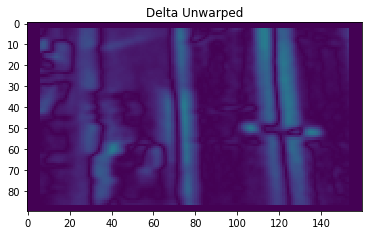

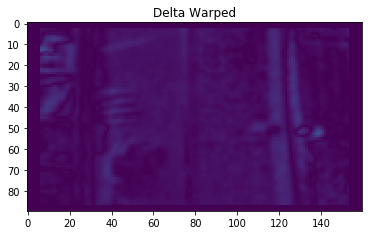

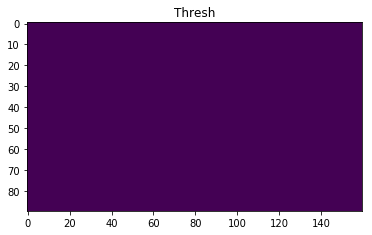

--IMAGE--
IMU Z (RAD/S): 371.653832
DELTA_T (S): 0.077901
PHI (RAD): 0.107856
DX (PIX): 16.356164
SCORE: -112941


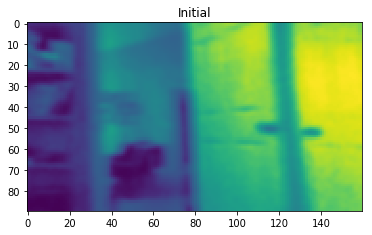

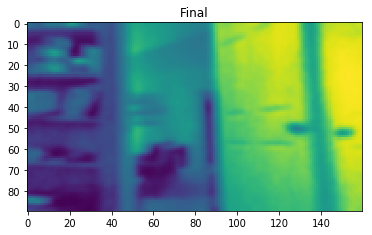

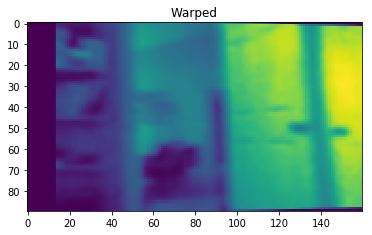

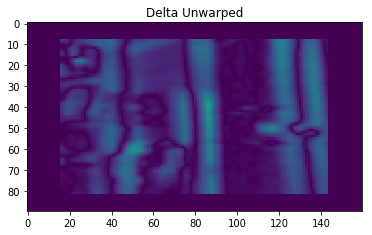

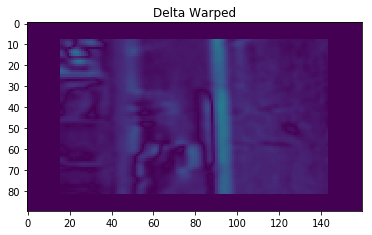

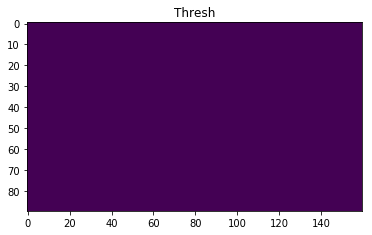

--IMAGE--
IMU Z (RAD/S): 395.674030
DELTA_T (S): 0.022075
PHI (RAD): 0.032538
DX (PIX): 4.934367
SCORE: -151517


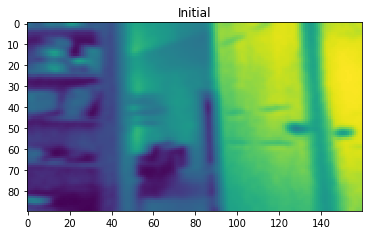

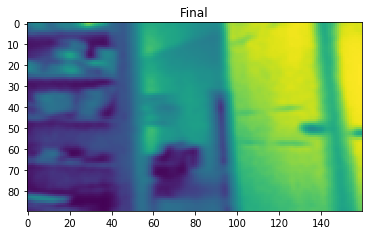

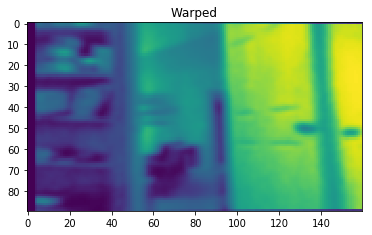

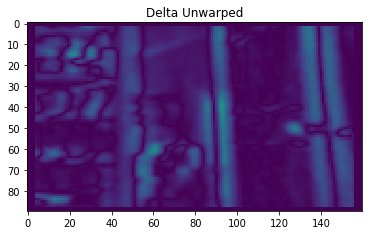

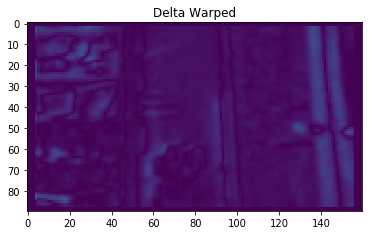

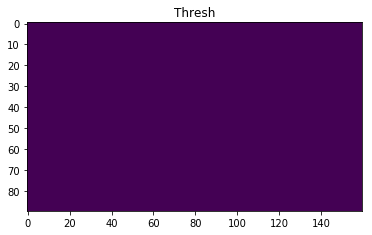

--IMAGE--
IMU Z (RAD/S): 419.980184
DELTA_T (S): 0.085425
PHI (RAD): 0.133652
DX (PIX): 20.268127
SCORE: -78877


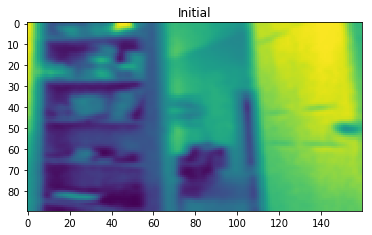

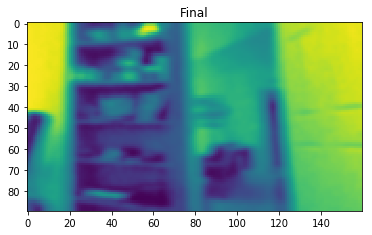

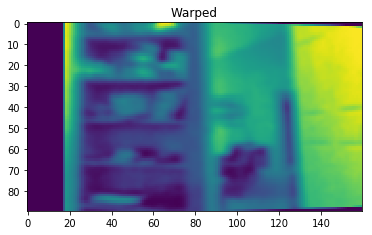

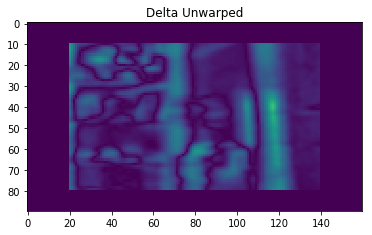

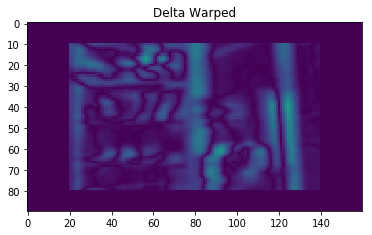

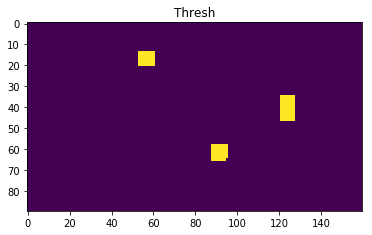

--IMAGE--
IMU Z (RAD/S): 360.787551
DELTA_T (S): 0.015470
PHI (RAD): 0.020792
DX (PIX): 3.153129
SCORE: -144125


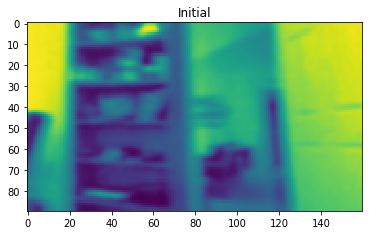

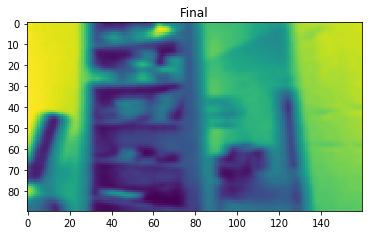

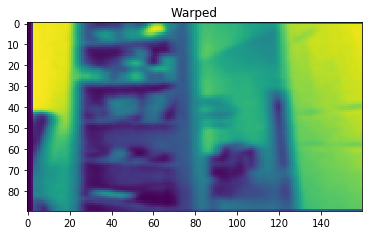

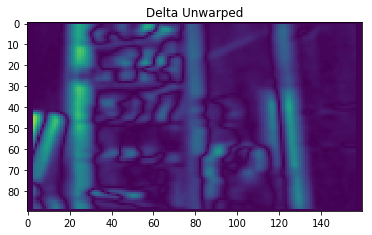

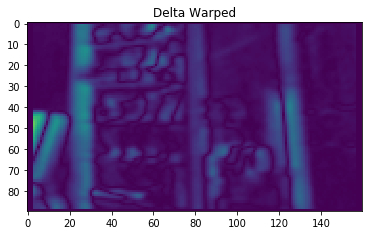

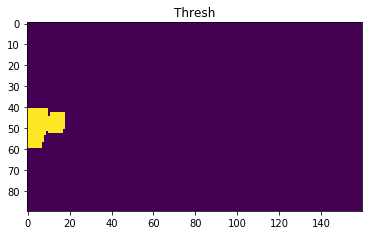

--IMAGE--
IMU Z (RAD/S): 376.229108
DELTA_T (S): 0.031991
PHI (RAD): 0.044838
DX (PIX): 6.799639
SCORE: -331746


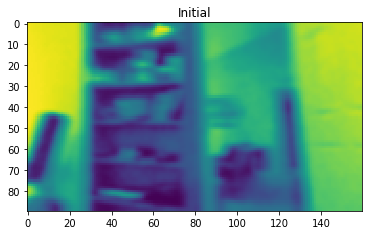

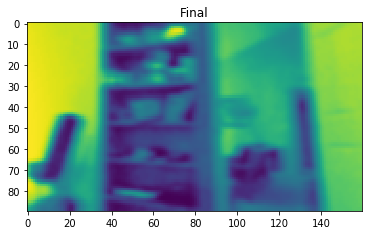

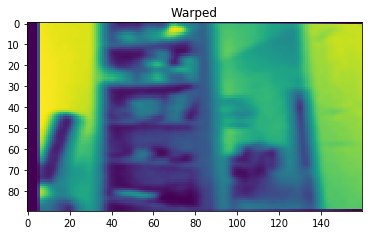

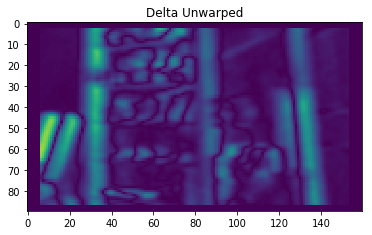

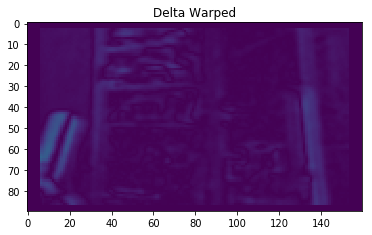

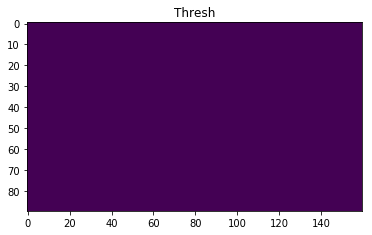

--IMAGE--
IMU Z (RAD/S): 364.790918
DELTA_T (S): 0.033783
PHI (RAD): 0.045909
DX (PIX): 6.962109
SCORE: -171620


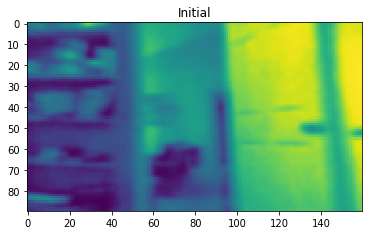

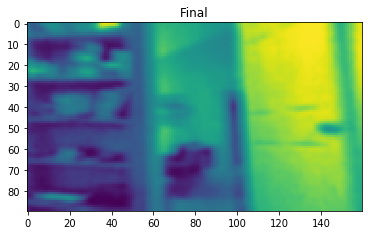

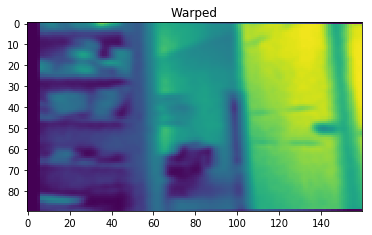

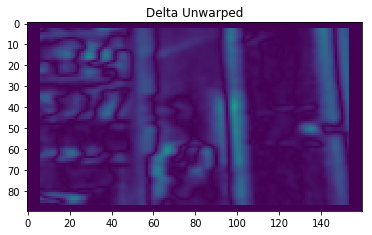

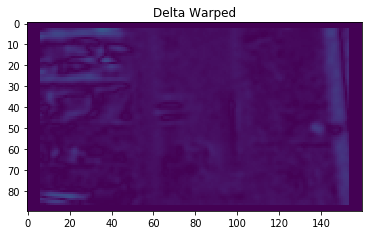

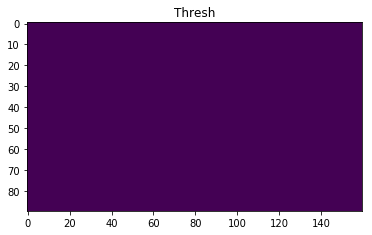

--IMAGE--
IMU Z (RAD/S): 391.098754
DELTA_T (S): 0.033303
PHI (RAD): 0.048521
DX (PIX): 7.358107
SCORE: -334448


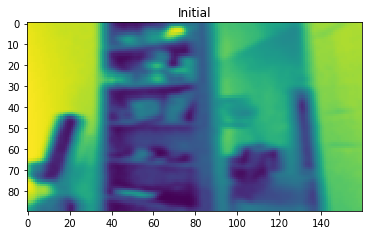

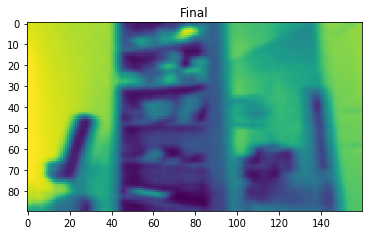

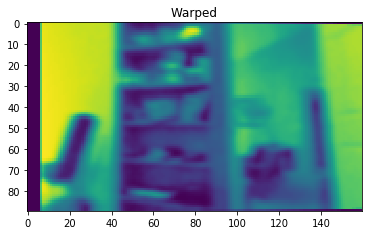

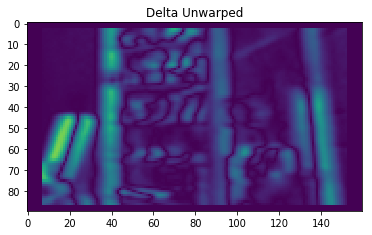

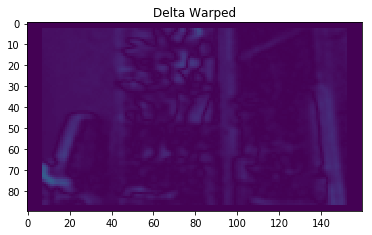

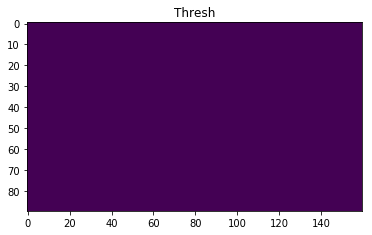

--IMAGE--
IMU Z (RAD/S): 368.222375
DELTA_T (S): 0.092295
PHI (RAD): 0.126605
DX (PIX): 19.199427
SCORE: -178052


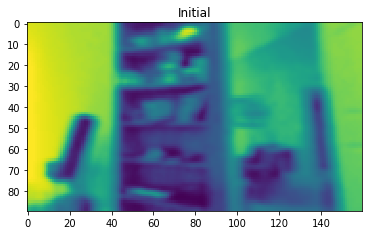

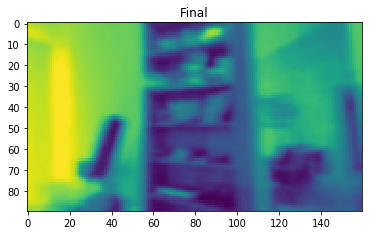

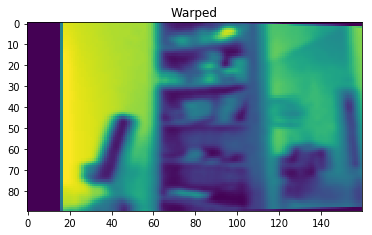

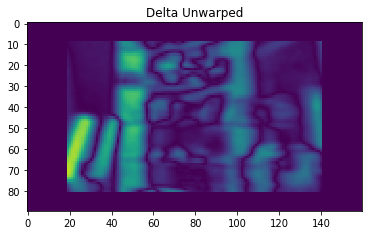

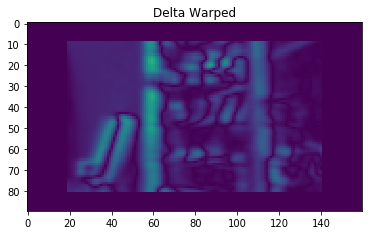

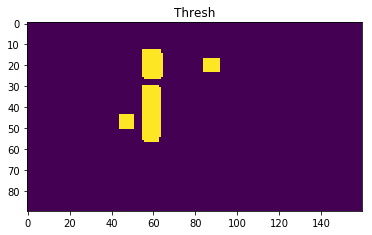

--IMAGE--
IMU Z (RAD/S): 347.633633
DELTA_T (S): 0.033767
PHI (RAD): 0.043729
DX (PIX): 6.631475
SCORE: -224915


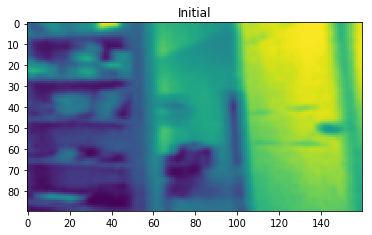

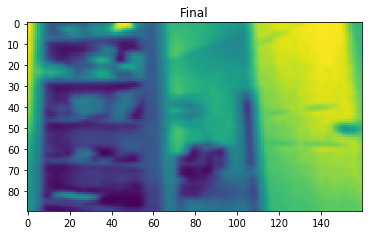

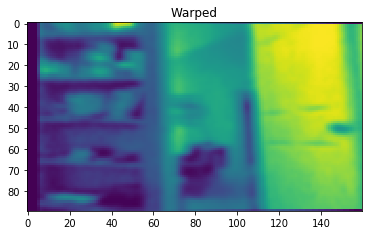

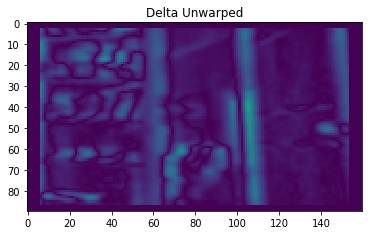

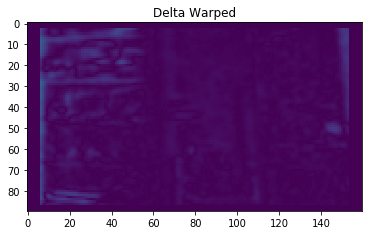

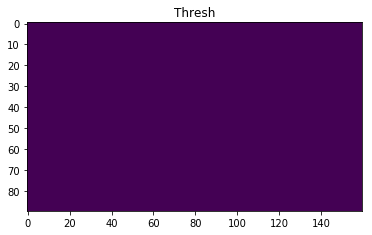

--IMAGE--
IMU Z (RAD/S): 164.622597
DELTA_T (S): 0.032500
PHI (RAD): 0.019931
DX (PIX): 3.022497
SCORE: 124411


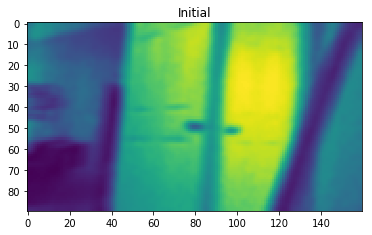

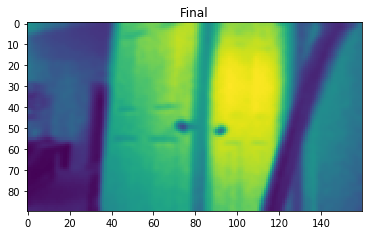

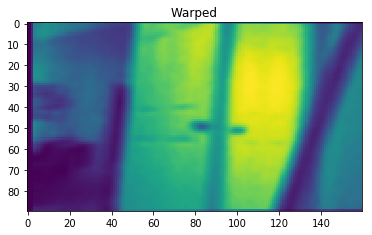

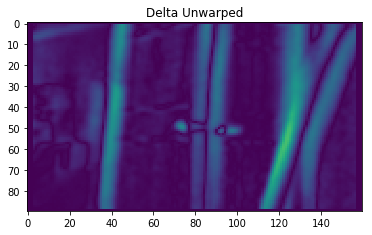

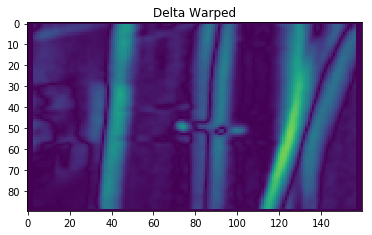

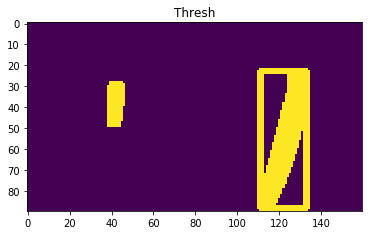

--IMAGE--
IMU Z (RAD/S): 264.134848
DELTA_T (S): 0.031945
PHI (RAD): 0.031433
DX (PIX): 4.766843
SCORE: 210143


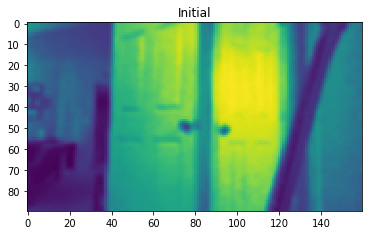

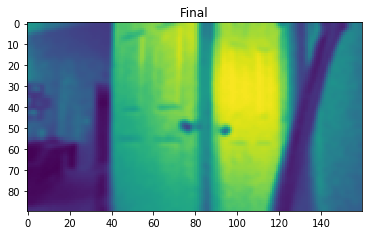

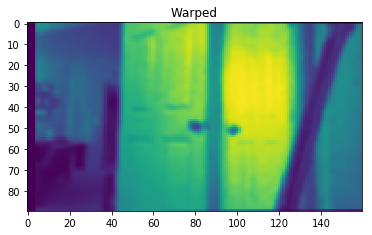

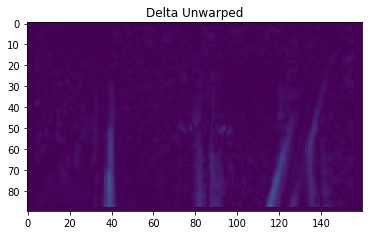

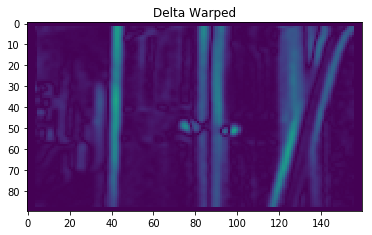

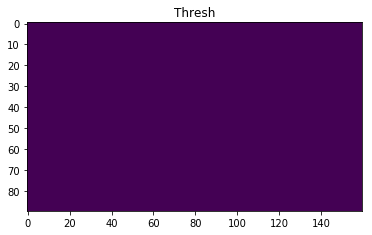

--IMAGE--
IMU Z (RAD/S): 474.025630
DELTA_T (S): 0.033742
PHI (RAD): 0.059584
DX (PIX): 9.035894
SCORE: -131334


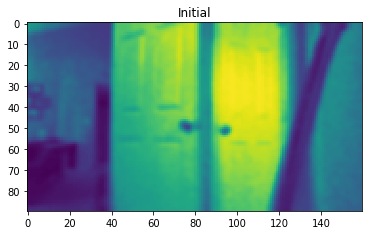

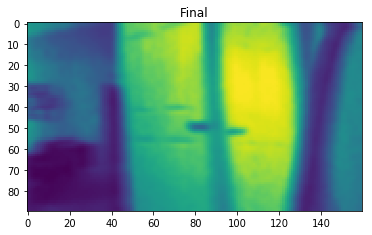

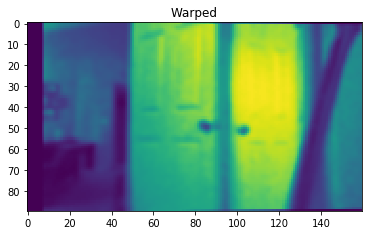

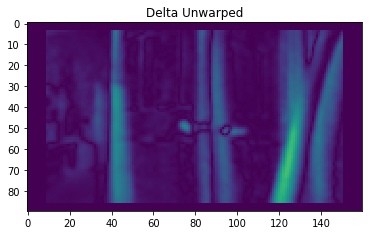

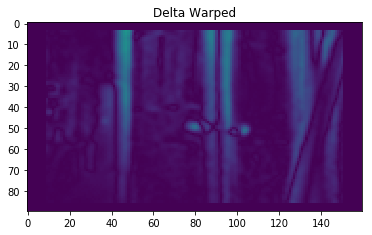

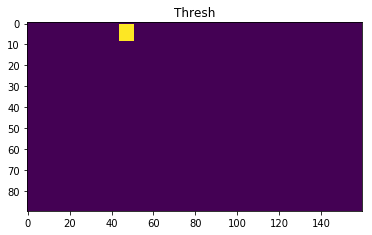

--IMAGE--
IMU Z (RAD/S): 299.879191
DELTA_T (S): 0.032508
PHI (RAD): 0.036316
DX (PIX): 5.507244
SCORE: -239327


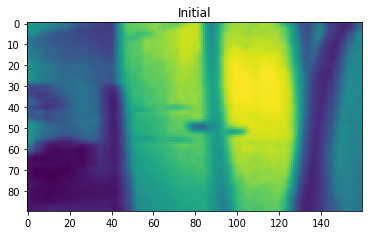

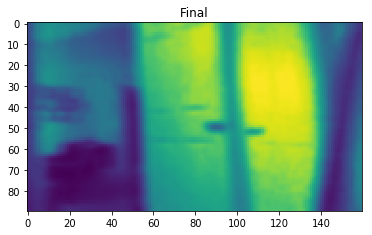

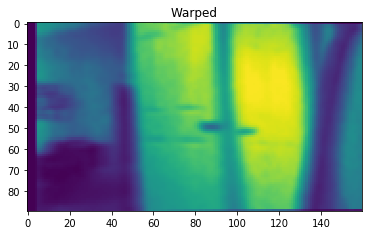

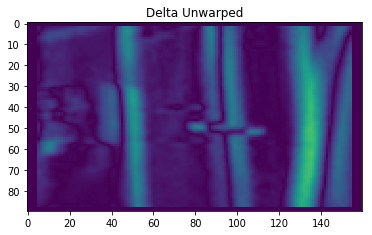

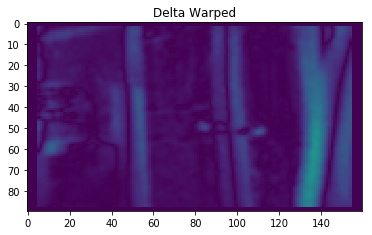

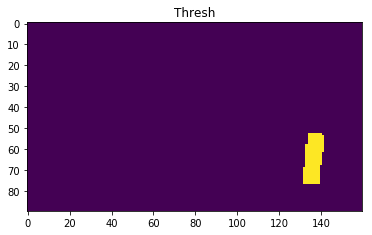

--IMAGE--
IMU Z (RAD/S): 284.151680
DELTA_T (S): 0.035175
PHI (RAD): 0.037234
DX (PIX): 5.646491
SCORE: -254613


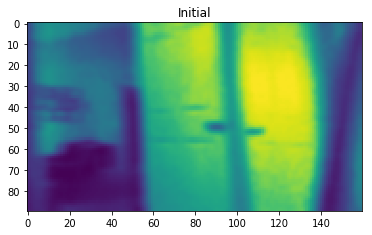

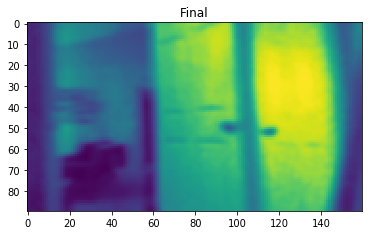

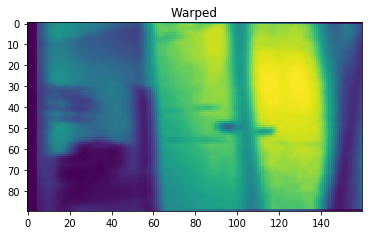

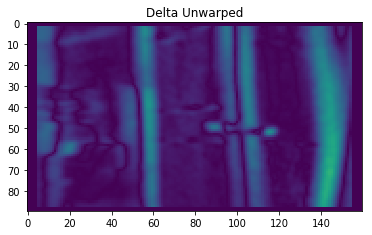

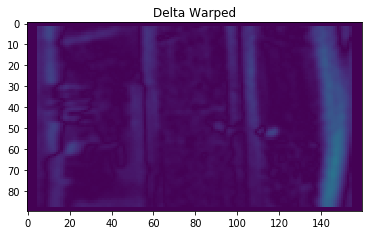

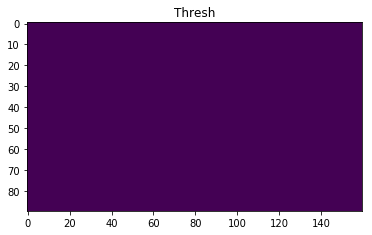

--IMAGE--
IMU Z (RAD/S): 363.075189
DELTA_T (S): 0.032463
PHI (RAD): 0.043908
DX (PIX): 6.658588
SCORE: -230850


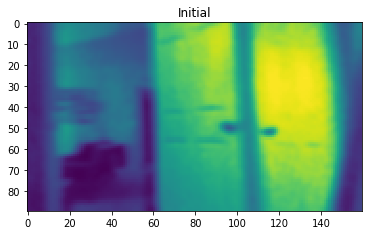

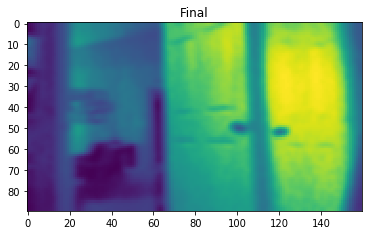

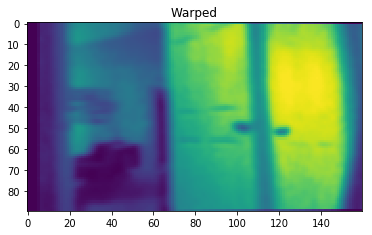

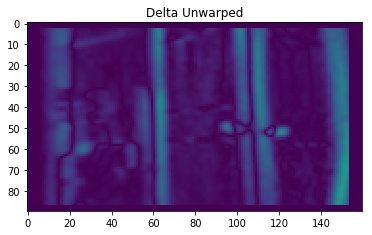

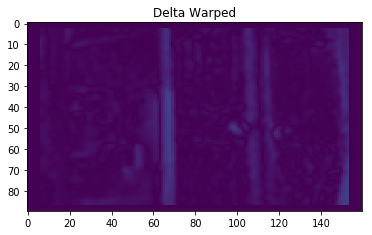

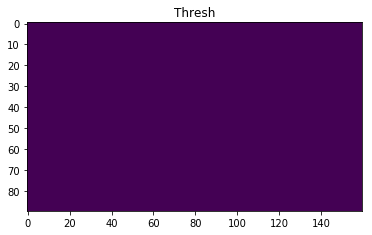

--IMAGE--
IMU Z (RAD/S): 449.433522
DELTA_T (S): 0.033634
PHI (RAD): 0.056313
DX (PIX): 8.539817
SCORE: -144925


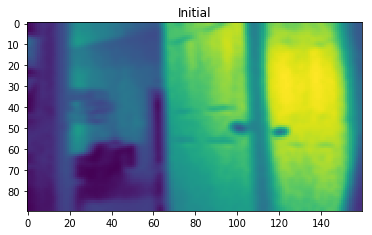

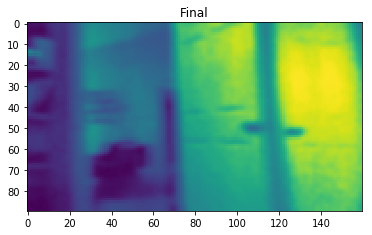

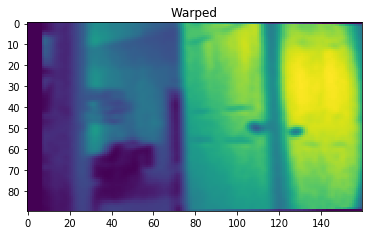

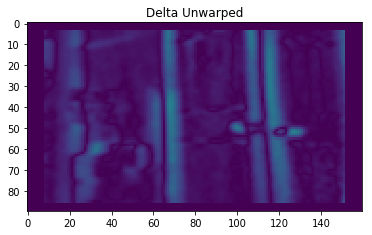

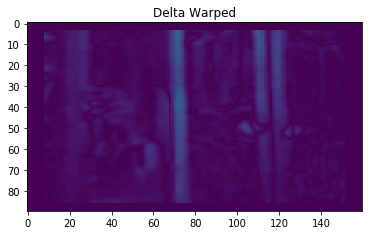

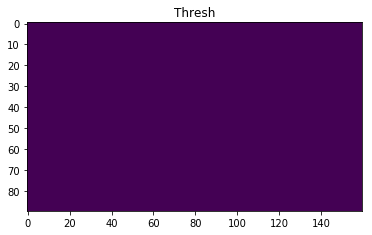

--IMAGE--
IMU Z (RAD/S): 415.690862
DELTA_T (S): 0.032488
PHI (RAD): 0.050310
DX (PIX): 7.629520
SCORE: -164833


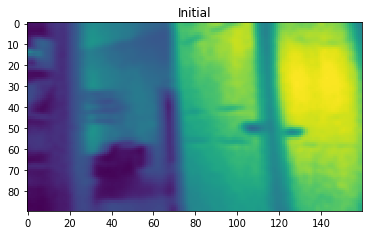

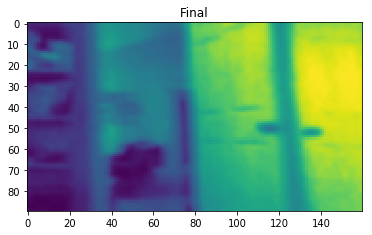

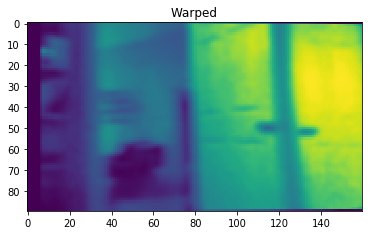

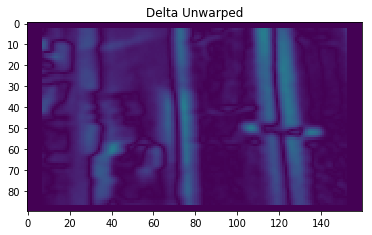

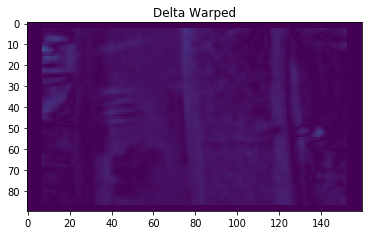

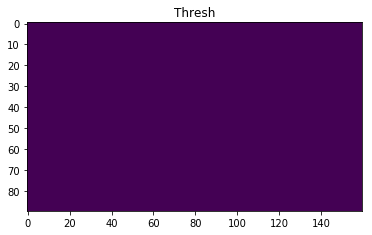

--IMAGE--
IMU Z (RAD/S): 347.347678
DELTA_T (S): 0.033723
PHI (RAD): 0.043637
DX (PIX): 6.617458
SCORE: -155160


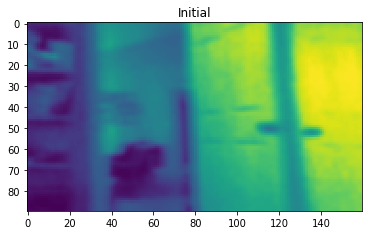

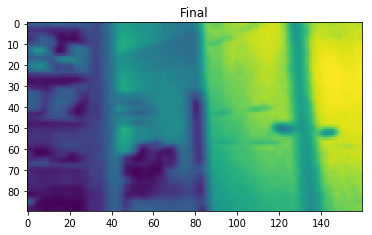

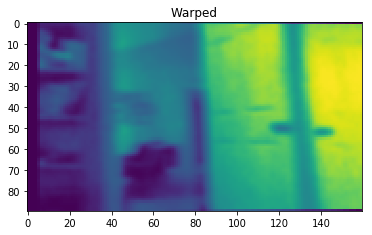

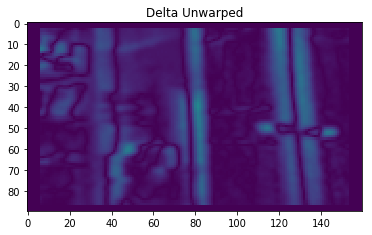

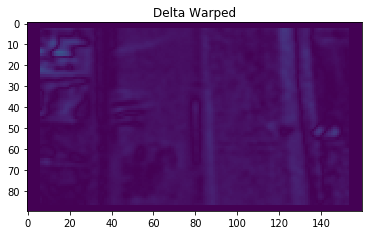

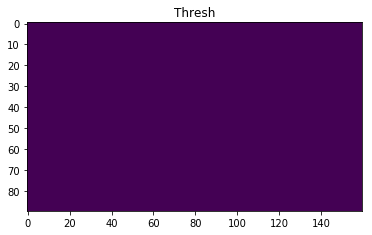

--IMAGE--
IMU Z (RAD/S): 369.652149
DELTA_T (S): 0.032492
PHI (RAD): 0.044744
DX (PIX): 6.785379
SCORE: -157959


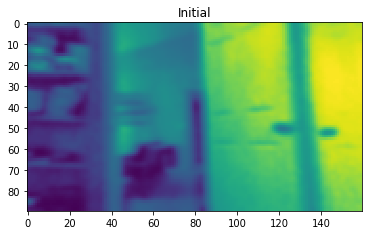

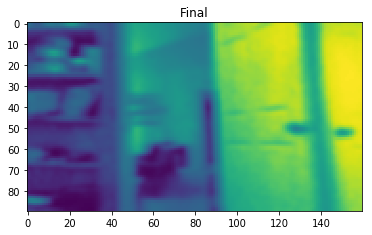

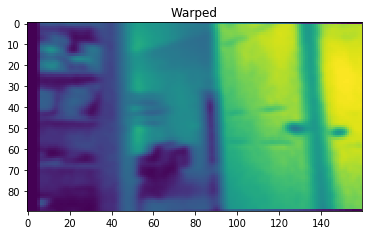

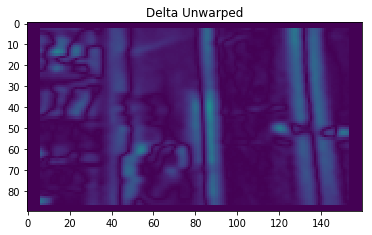

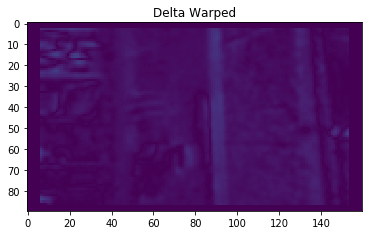

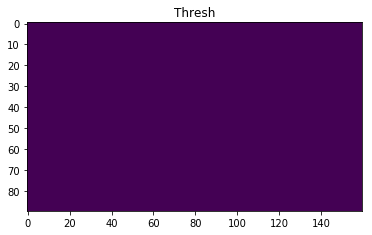

--IMAGE--
IMU Z (RAD/S): 421.409957
DELTA_T (S): 0.033774
PHI (RAD): 0.053022
DX (PIX): 8.040652
SCORE: -148863


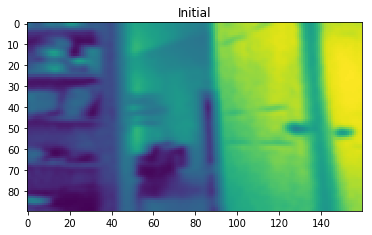

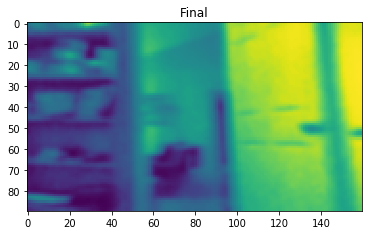

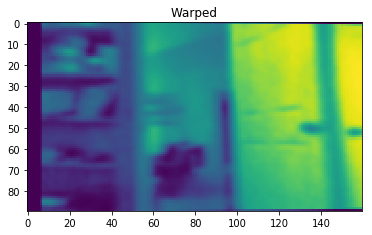

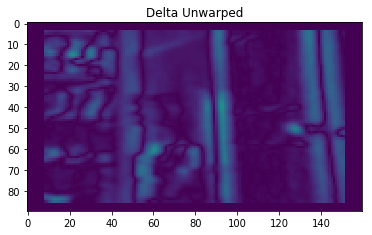

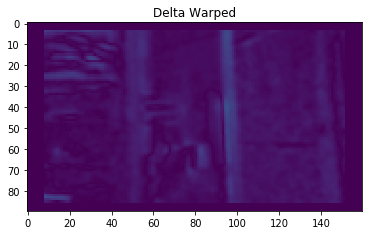

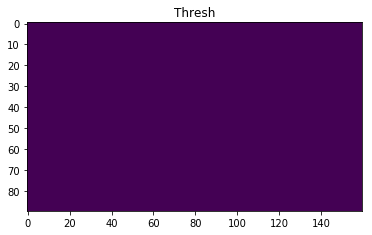

--IMAGE--
IMU Z (RAD/S): 349.921271
DELTA_T (S): 0.033770
PHI (RAD): 0.044021
DX (PIX): 6.675680
SCORE: -174212


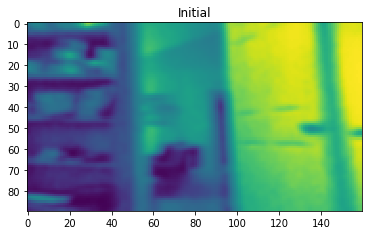

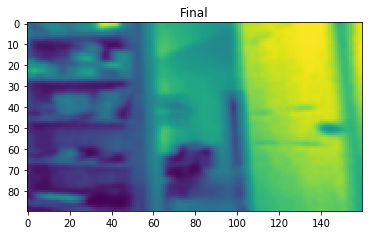

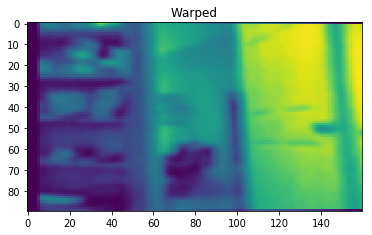

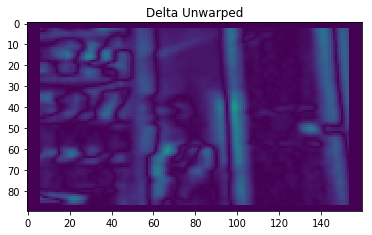

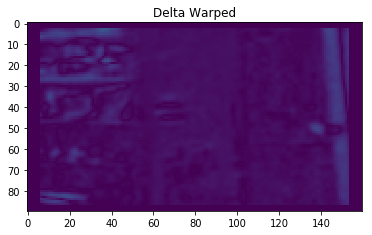

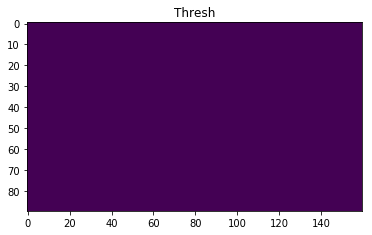

--IMAGE--
IMU Z (RAD/S): 375.943153
DELTA_T (S): 0.033743
PHI (RAD): 0.047257
DX (PIX): 7.166394
SCORE: -204942


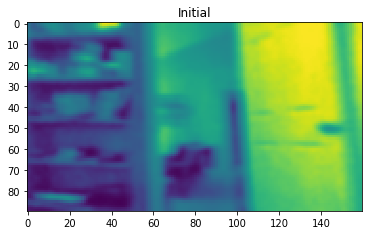

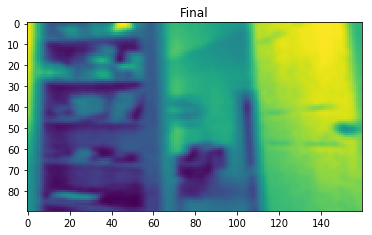

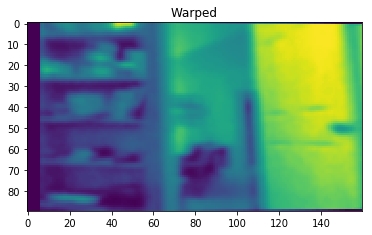

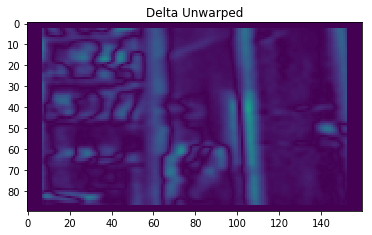

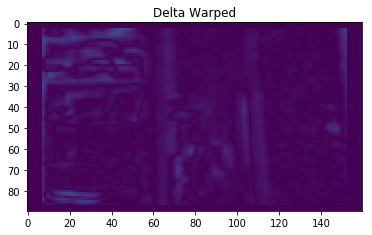

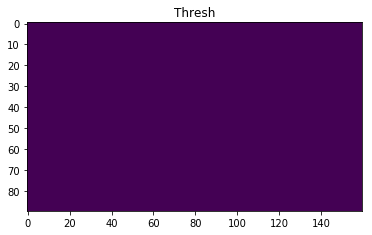

--IMAGE--
IMU Z (RAD/S): 212.948948
DELTA_T (S): 0.078927
PHI (RAD): 0.062613
DX (PIX): 9.495120
SCORE: -70027


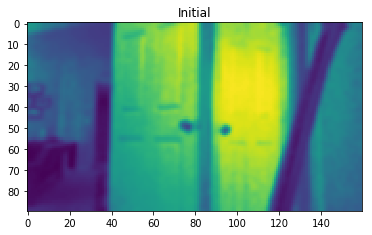

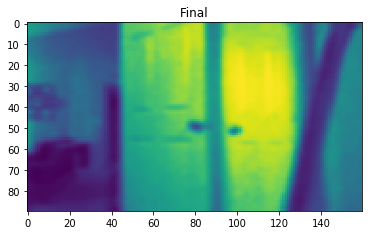

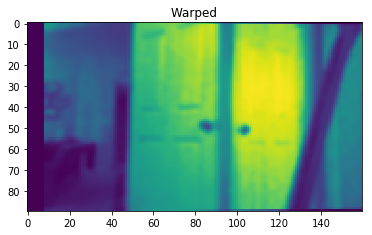

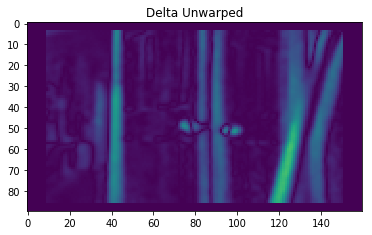

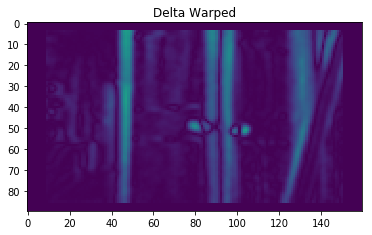

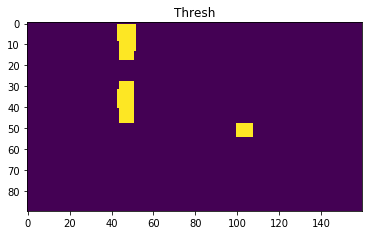

--IMAGE--
IMU Z (RAD/S): 286.439318
DELTA_T (S): 0.022274
PHI (RAD): 0.023768
DX (PIX): 3.604339
SCORE: -202985


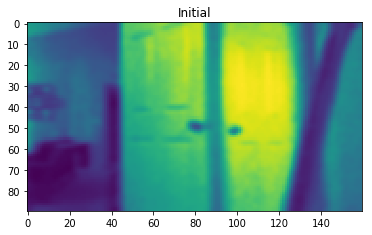

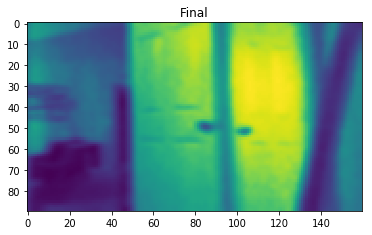

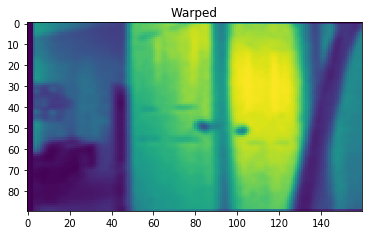

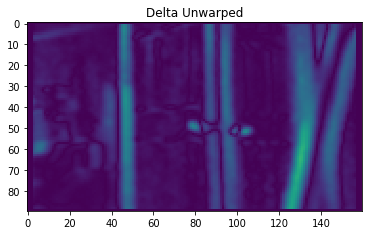

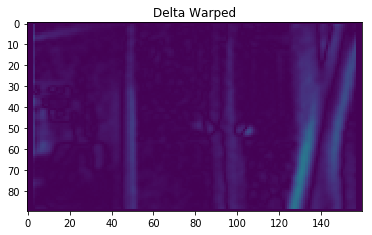

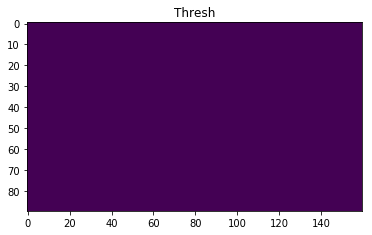

--IMAGE--
IMU Z (RAD/S): 218.096134
DELTA_T (S): 0.032645
PHI (RAD): 0.026523
DX (PIX): 4.022170
SCORE: -211112


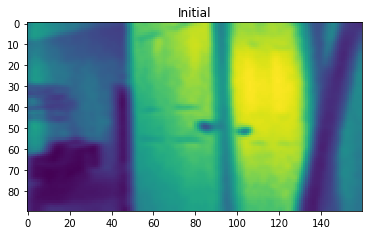

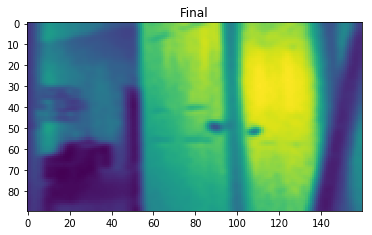

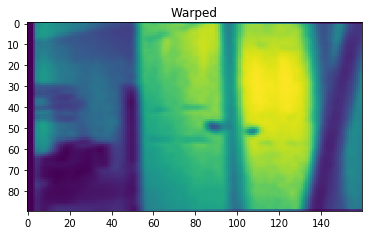

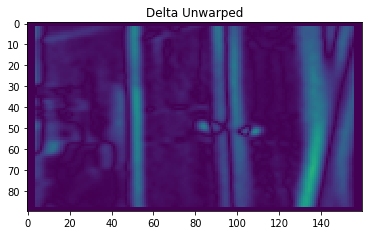

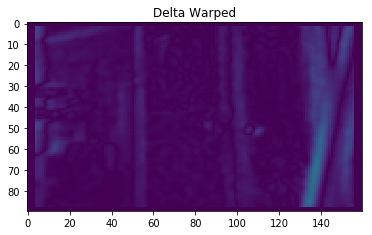

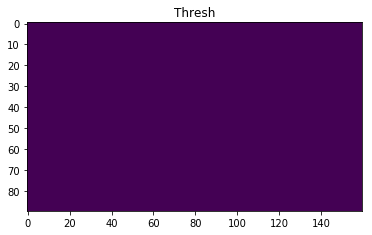

Best: avg_imu_z
STD: 0.000000
Score: -15065449
Processed: 0.317881


In [283]:
skip_count = 0
process_count = 0

files = open('data/list.txt', 'r').read().split("\n")

best_phi = []

sigma = 0.
for file in files:
    try:
        dat = json.loads(open('data/' + file, 'r').read())
    except IsADirectoryError:
        continue
                
    t1 = dat['image_initial']
    t2 = dat['image_final']
    
    dat['image_final'] = t1
    dat['image_initial'] = t2
        
    s = stats(dat)
    
    phi_try_names = ['avg_imu_z', 'mid_imu_z', 'min_imu_z', 'max_imu_z']
    phi_tries = [s['avg_imu_z'], s['mid_imu_z'], s['min_imu_z'], s['max_imu_z']]
    phi_tries = [s['min_imu_z']]
    
    scores = np.zeros((len(phi_tries),2))
    
    for phi_index, phi in enumerate(phi_tries):
        score = explore(dat, s, phi, debug=True)
        scores[phi_index][0] = phi_tries[phi_index]
        scores[phi_index][1] = score
        if score == 0:
            break
            
        sigma += score
        
    if np.sum(scores[:,1]) != 0:        
        best_phi.append(np.argmin(scores[:,1]))
    

best_array = np.array(best_phi)

best_index = np.argmax(np.bincount(best_array))

print("Best: %s" % phi_try_names[best_index])
print("STD: %f" % best_array.std())

print("Score: %d" % (sigma))
print("Processed: %f" % (process_count / (process_count + skip_count) ))




AttributeError: module 'cv2' has no attribute 'version'